# 🧱 DCGAN - Bricks Data

In this notebook, we'll walk through the steps required to train your own DCGAN on the bricks dataset

In [1]:
#%load_ext autoreload
#%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    losses,
    utils,
    metrics,
    optimizers,
)

from utils import display, sample_batch

## 0. Parameters <a name="parameters"></a>

In [36]:
IMAGE_SIZE = 64
CHANNELS = 1
BATCH_SIZE = 128
Z_DIM = 100
#EPOCHS = 300
EPOCHS = 150
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
LEARNING_RATE = 0.0002
NOISE_PARAM = 0.1

## 1. Prepare the data <a name="prepare"></a>

In [3]:
train_data = utils.image_dataset_from_directory(
    "./lego-brick-images/",
    labels=None,
    color_mode="grayscale",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 6379 files.


In [4]:
train_data

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 64, 64, 1), dtype=tf.float32, name=None)>

In [5]:
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5     # original data [0, 255]. data to the range [–1, 1] so that we can use the tanh
    return img


train = train_data.map(lambda x: preprocess(x))

In [6]:
train_sample = sample_batch(train)

In [7]:
train_sample.shape

(128, 64, 64, 1)

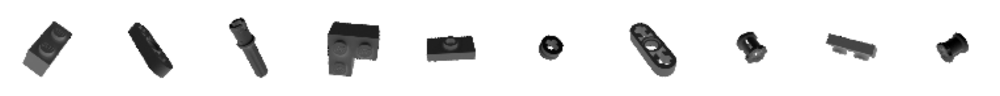

In [8]:
display(train_sample)

## 2. Build the GAN <a name="build"></a>

In [9]:
# Descriminator -- supervised image classification problem

discriminator_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", use_bias=False)(discriminator_input)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)

x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)

x = layers.Conv2D(256, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)

x = layers.Conv2D(512, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)

x = layers.Conv2D(1, kernel_size=4, strides=1, padding="valid", use_bias=False, activation="sigmoid",)(x)
discriminator_output = layers.Flatten()(x)

discriminator = models.Model(discriminator_input, discriminator_output)
discriminator.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 64, 64, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │       131,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 256)      │       524,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 512)      │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 4, 4, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 1, 1, 1)        │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,765,312 (10.55 MB)

 Trainable params: 2,763,520 (10.54 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [ ]:
# Generator -- Conv layers to make images from noise

generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(512, kernel_size=4, strides=1, padding="valid", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

x = layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

x = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

x = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)

generator_output = layers.Conv2DTranspose(CHANNELS, kernel_size=4, strides=2, padding="same", use_bias=False, activation="tanh",)(x)

generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 1, 1, 100)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 4, 4, 512)      │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 4, 4, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 8, 8, 256)      │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 16, 16, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 32, 32, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 64, 64, 1)      │         1,024 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,576,576 (13.64 MB)

 Trainable params: 3,574,656 (13.64 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [ ]:
# generator’s loss function is the binary cross-entropy between the discriminator’s predicted probabilities and a vector of ones (which means "real" labels).
from tensorflow.keras.losses import BinaryCrossentropy

# Define binary cross-entropy loss
bce = BinaryCrossentropy(from_logits=True)

# Example: Assume the discriminator's predictions on fake images
# (Values are between -∞ and +∞ if using logits, but after sigmoid, they are between 0 and 1)
discriminator_predictions = tf.constant([0.1, 0.3, 0.7, 0.9])  # Fake images -- increasing probability would decrease the loss

# The generator wants the discriminator to classify fake images as real (label = 1)
real_labels = tf.ones_like(discriminator_predictions)  # Vector of ones

# Compute generator loss
generator_loss = bce(real_labels, discriminator_predictions)

print("Generator Loss:", generator_loss.numpy())


Generator Loss: 0.48577297


In [17]:
class DCGAN(models.Model):
    def __init__(self, discriminator, generator, latent_dim):   # It initializes the discriminator, generator, and latent space dimension.

        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer):
        super(DCGAN, self).compile()
        self.loss_fn = losses.BinaryCrossentropy()
        self.d_optimizer = d_optimizer  # Discriminator optimizer
        self.g_optimizer = g_optimizer  # Generator optimizer
        self.d_loss_metric = metrics.Mean(name="d_loss")
        self.d_real_acc_metric = metrics.BinaryAccuracy(name="d_real_acc")  
        self.d_fake_acc_metric = metrics.BinaryAccuracy(name="d_fake_acc")
        self.d_acc_metric = metrics.BinaryAccuracy(name="d_acc")    # The discriminator's accuracy is divided into real accuracy (real images) and fake accuracy (fake images).
        self.g_loss_metric = metrics.Mean(name="g_loss")
        self.g_acc_metric = metrics.BinaryAccuracy(name="g_acc")

    @property
    def metrics(self):  # The metrics property returns the metrics that we want to track during training.
        return [
            self.d_loss_metric,
            self.d_real_acc_metric,
            self.d_fake_acc_metric,
            self.d_acc_metric,
            self.g_loss_metric,
            self.g_acc_metric,
        ]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))   # Creates a random noise vector (latent space) as input to the generator.

        # Train the discriminator on fake images
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:     # Forward Pass
            generated_images = self.generator(random_latent_vectors, training=True) # Generate fake images
            real_predictions = self.discriminator(real_images, training=True)   # Predictions on real images
            fake_predictions = self.discriminator(generated_images, training=True)  # Predictions on fake images

            real_labels = tf.ones_like(real_predictions)    # Real images
            real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(tf.shape(real_predictions))   # Add noise to the labels

            fake_labels = tf.zeros_like(fake_predictions)   # Fake images
            fake_noisy_labels = fake_labels - NOISE_PARAM * tf.random.uniform(tf.shape(fake_predictions))   

            d_real_loss = self.loss_fn(real_noisy_labels, real_predictions)     # Compares real images with smoothed real labels.
            d_fake_loss = self.loss_fn(fake_noisy_labels, fake_predictions)     # Compares fake images with smoothed fake labels.
            d_loss = (d_real_loss + d_fake_loss) / 2.0

            g_loss = self.loss_fn(real_labels, fake_predictions)    # The generator wants the discriminator to classify fake images as real.

        # Backward Pass -- Compute Gradients & Update Weights
        gradients_of_discriminator = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)     # Computes gradients for both networks and updates weights.
        gradients_of_generator = gen_tape.gradient(g_loss, self.generator.trainable_variables)

        self.d_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
        self.g_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.d_real_acc_metric.update_state(real_labels, real_predictions)
        self.d_fake_acc_metric.update_state(fake_labels, fake_predictions)
        self.d_acc_metric.update_state([real_labels, fake_labels], [real_predictions, fake_predictions])
        self.g_loss_metric.update_state(g_loss)
        self.g_acc_metric.update_state(real_labels, fake_predictions)

        return {m.name: m.result() for m in self.metrics}

In [18]:
# Create a DCGAN
dcgan = DCGAN(
    discriminator=discriminator, generator=generator, latent_dim=Z_DIM
)

In [ ]:
if LOAD_MODEL:
    dcgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [19]:
dcgan.compile(
    d_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [24]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/.weights.h5",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
        )

Epoch 1/150


50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.8994 - d_fake_acc: 0.9062 - d_loss: 0.0282 - d_real_acc: 0.8926 - g_acc: 0.0938 - g_loss: 5.2147
Saved to ./output/generated_img_000.png


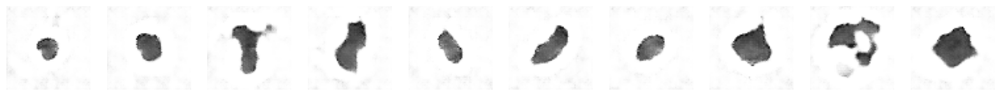

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.8989 - d_fake_acc: 0.9056 - d_loss: 0.0298 - d_real_acc: 0.8922 - g_acc: 0.0944 - g_loss: 5.2190
Epoch 2/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9306 - d_fake_acc: 0.9361 - d_loss: -0.0675 - d_real_acc: 0.9251 - g_acc: 0.0639 - g_loss: 5.3911
Saved to ./output/generated_img_001.png


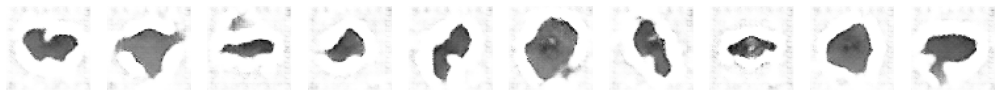

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9303 - d_fake_acc: 0.9358 - d_loss: -0.0664 - d_real_acc: 0.9249 - g_acc: 0.0642 - g_loss: 5.3896
Epoch 3/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.9207 - d_fake_acc: 0.9240 - d_loss: -0.0575 - d_real_acc: 0.9174 - g_acc: 0.0760 - g_loss: 5.3882
Saved to ./output/generated_img_002.png


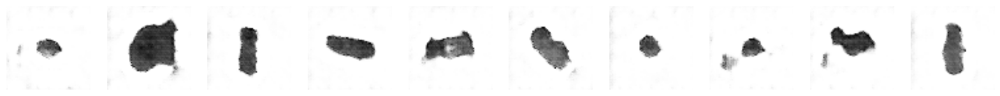

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - d_acc: 0.9203 - d_fake_acc: 0.9235 - d_loss: -0.0554 - d_real_acc: 0.9170 - g_acc: 0.0765 - g_loss: 5.3875
Epoch 4/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.8443 - d_fake_acc: 0.8369 - d_loss: 0.1952 - d_real_acc: 0.8518 - g_acc: 0.1631 - g_loss: 5.4599
Saved to ./output/generated_img_003.png


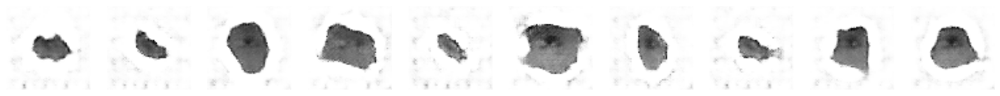

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.8448 - d_fake_acc: 0.8374 - d_loss: 0.1942 - d_real_acc: 0.8522 - g_acc: 0.1626 - g_loss: 5.4565
Epoch 5/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9307 - d_fake_acc: 0.9340 - d_loss: -0.0756 - d_real_acc: 0.9274 - g_acc: 0.0660 - g_loss: 5.3343
Saved to ./output/generated_img_004.png


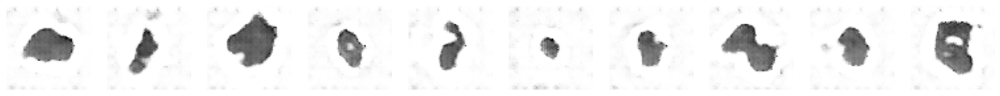

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9306 - d_fake_acc: 0.9338 - d_loss: -0.0753 - d_real_acc: 0.9273 - g_acc: 0.0662 - g_loss: 5.3351
Epoch 6/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.8945 - d_fake_acc: 0.8971 - d_loss: 0.0252 - d_real_acc: 0.8919 - g_acc: 0.1029 - g_loss: 5.4403
Saved to ./output/generated_img_005.png


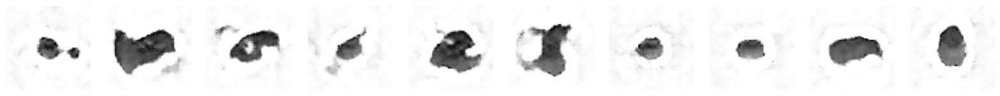

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.8947 - d_fake_acc: 0.8973 - d_loss: 0.0245 - d_real_acc: 0.8922 - g_acc: 0.1027 - g_loss: 5.4486
Epoch 7/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9179 - d_fake_acc: 0.9207 - d_loss: -0.0476 - d_real_acc: 0.9152 - g_acc: 0.0793 - g_loss: 5.8656
Saved to ./output/generated_img_006.png


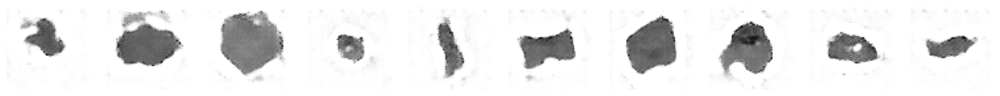

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9177 - d_fake_acc: 0.9203 - d_loss: -0.0467 - d_real_acc: 0.9150 - g_acc: 0.0797 - g_loss: 5.8652
Epoch 8/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9191 - d_fake_acc: 0.9245 - d_loss: -0.0351 - d_real_acc: 0.9138 - g_acc: 0.0755 - g_loss: 5.7238
Saved to ./output/generated_img_007.png


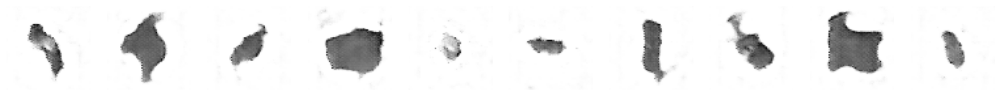

50/50 ━━━━━━━━━━━━━━━━━━━━ 20s 231ms/step - d_acc: 0.9188 - d_fake_acc: 0.9240 - d_loss: -0.0336 - d_real_acc: 0.9135 - g_acc: 0.0760 - g_loss: 5.7248
Epoch 9/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.8007 - d_fake_acc: 0.8029 - d_loss: 0.4346 - d_real_acc: 0.7984 - g_acc: 0.1971 - g_loss: 4.9083
Saved to ./output/generated_img_008.png


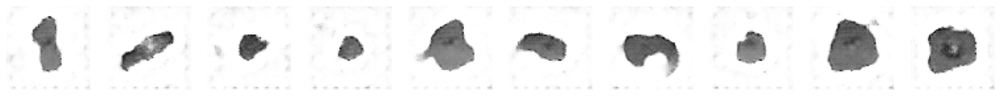

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.8017 - d_fake_acc: 0.8039 - d_loss: 0.4306 - d_real_acc: 0.7995 - g_acc: 0.1961 - g_loss: 4.9126
Epoch 10/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9433 - d_fake_acc: 0.9402 - d_loss: -0.1181 - d_real_acc: 0.9464 - g_acc: 0.0598 - g_loss: 5.2102
Saved to ./output/generated_img_009.png


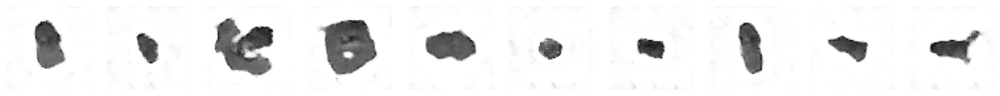

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9430 - d_fake_acc: 0.9399 - d_loss: -0.1168 - d_real_acc: 0.9460 - g_acc: 0.0601 - g_loss: 5.2148
Epoch 11/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9127 - d_fake_acc: 0.9125 - d_loss: -0.0282 - d_real_acc: 0.9129 - g_acc: 0.0875 - g_loss: 5.2435
Saved to ./output/generated_img_010.png


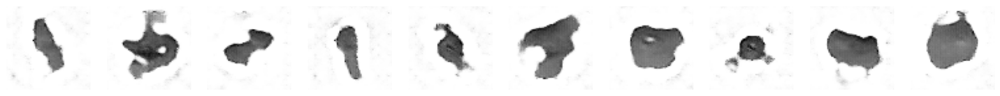

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9129 - d_fake_acc: 0.9126 - d_loss: -0.0288 - d_real_acc: 0.9131 - g_acc: 0.0874 - g_loss: 5.2486
Epoch 12/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.8910 - d_fake_acc: 0.8927 - d_loss: 0.0474 - d_real_acc: 0.8893 - g_acc: 0.1073 - g_loss: 5.4165
Saved to ./output/generated_img_011.png


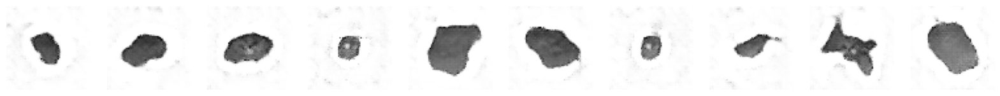

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - d_acc: 0.8915 - d_fake_acc: 0.8931 - d_loss: 0.0457 - d_real_acc: 0.8898 - g_acc: 0.1069 - g_loss: 5.4203
Epoch 13/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9304 - d_fake_acc: 0.9299 - d_loss: -0.0589 - d_real_acc: 0.9309 - g_acc: 0.0701 - g_loss: 5.7850
Saved to ./output/generated_img_012.png


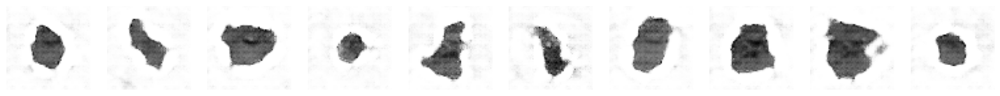

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9300 - d_fake_acc: 0.9295 - d_loss: -0.0574 - d_real_acc: 0.9305 - g_acc: 0.0705 - g_loss: 5.7819
Epoch 14/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.8608 - d_fake_acc: 0.8679 - d_loss: 0.2683 - d_real_acc: 0.8538 - g_acc: 0.1321 - g_loss: 5.7351
Saved to ./output/generated_img_013.png


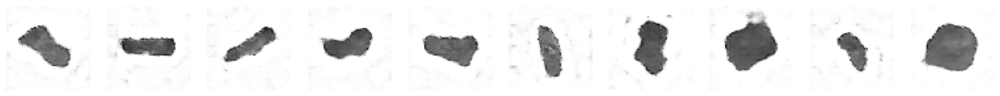

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.8614 - d_fake_acc: 0.8683 - d_loss: 0.2652 - d_real_acc: 0.8545 - g_acc: 0.1317 - g_loss: 5.7282
Epoch 15/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9553 - d_fake_acc: 0.9570 - d_loss: -0.1684 - d_real_acc: 0.9536 - g_acc: 0.0430 - g_loss: 6.2743
Saved to ./output/generated_img_014.png


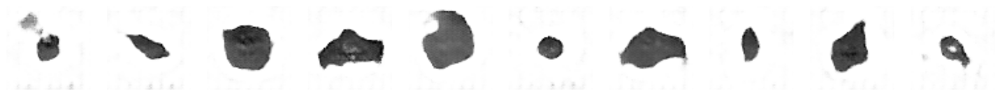

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9549 - d_fake_acc: 0.9565 - d_loss: -0.1669 - d_real_acc: 0.9532 - g_acc: 0.0435 - g_loss: 6.2688
Epoch 16/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.9003 - d_fake_acc: 0.9042 - d_loss: 0.0356 - d_real_acc: 0.8964 - g_acc: 0.0958 - g_loss: 5.8711
Saved to ./output/generated_img_015.png


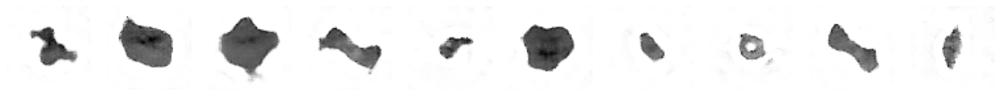

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.8996 - d_fake_acc: 0.9034 - d_loss: 0.0384 - d_real_acc: 0.8958 - g_acc: 0.0966 - g_loss: 5.8705
Epoch 17/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9373 - d_fake_acc: 0.9370 - d_loss: -0.1133 - d_real_acc: 0.9376 - g_acc: 0.0630 - g_loss: 5.5446
Saved to ./output/generated_img_016.png


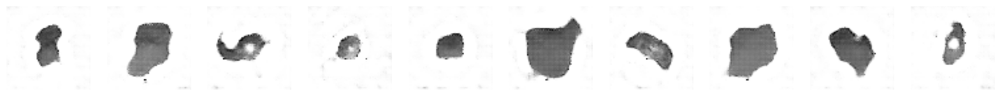

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9374 - d_fake_acc: 0.9371 - d_loss: -0.1140 - d_real_acc: 0.9377 - g_acc: 0.0629 - g_loss: 5.5525
Epoch 18/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9574 - d_fake_acc: 0.9606 - d_loss: -0.2063 - d_real_acc: 0.9542 - g_acc: 0.0394 - g_loss: 6.9286
Saved to ./output/generated_img_017.png


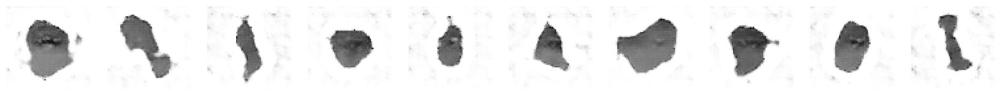

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9573 - d_fake_acc: 0.9605 - d_loss: -0.2058 - d_real_acc: 0.9541 - g_acc: 0.0395 - g_loss: 6.9261
Epoch 19/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.8781 - d_fake_acc: 0.8777 - d_loss: 0.1300 - d_real_acc: 0.8785 - g_acc: 0.1223 - g_loss: 5.9974
Saved to ./output/generated_img_018.png


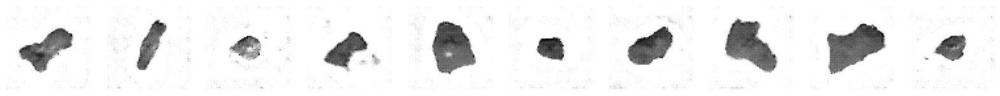

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.8786 - d_fake_acc: 0.8783 - d_loss: 0.1279 - d_real_acc: 0.8789 - g_acc: 0.1217 - g_loss: 5.9954
Epoch 20/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - d_acc: 0.9038 - d_fake_acc: 0.8991 - d_loss: -0.0179 - d_real_acc: 0.9085 - g_acc: 0.1009 - g_loss: 5.8608
Saved to ./output/generated_img_019.png


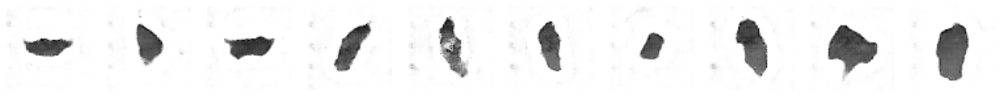

50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step - d_acc: 0.9044 - d_fake_acc: 0.8998 - d_loss: -0.0201 - d_real_acc: 0.9090 - g_acc: 0.1002 - g_loss: 5.8704
Epoch 21/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9120 - d_fake_acc: 0.9115 - d_loss: -0.0617 - d_real_acc: 0.9126 - g_acc: 0.0885 - g_loss: 6.5766
Saved to ./output/generated_img_020.png


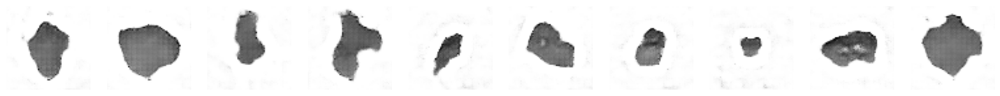

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9123 - d_fake_acc: 0.9117 - d_loss: -0.0627 - d_real_acc: 0.9128 - g_acc: 0.0883 - g_loss: 6.5808
Epoch 22/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9740 - d_fake_acc: 0.9754 - d_loss: -0.2679 - d_real_acc: 0.9726 - g_acc: 0.0246 - g_loss: 7.0451
Saved to ./output/generated_img_021.png


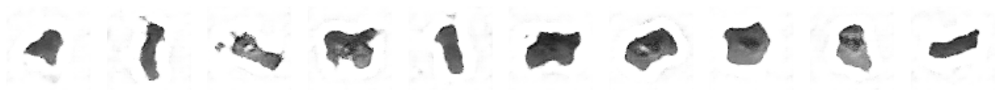

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9737 - d_fake_acc: 0.9751 - d_loss: -0.2671 - d_real_acc: 0.9723 - g_acc: 0.0249 - g_loss: 7.0454
Epoch 23/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - d_acc: 0.9785 - d_fake_acc: 0.9776 - d_loss: -0.3096 - d_real_acc: 0.9794 - g_acc: 0.0224 - g_loss: 7.8728
Saved to ./output/generated_img_022.png


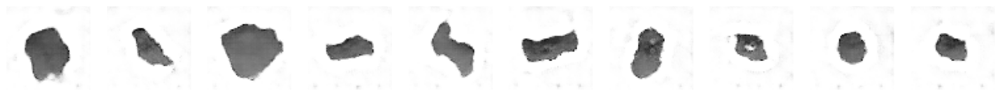

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - d_acc: 0.9780 - d_fake_acc: 0.9773 - d_loss: -0.3071 - d_real_acc: 0.9789 - g_acc: 0.0227 - g_loss: 7.8754
Epoch 24/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.7673 - d_fake_acc: 0.7391 - d_loss: 0.5956 - d_real_acc: 0.7955 - g_acc: 0.2609 - g_loss: 4.1337
Saved to ./output/generated_img_023.png


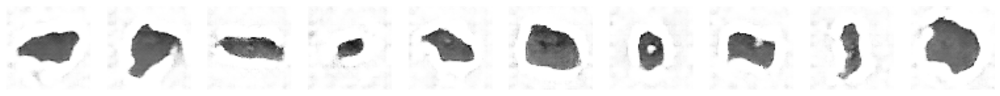

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.7686 - d_fake_acc: 0.7408 - d_loss: 0.5897 - d_real_acc: 0.7963 - g_acc: 0.2592 - g_loss: 4.1495
Epoch 25/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - d_acc: 0.9160 - d_fake_acc: 0.9216 - d_loss: -0.0347 - d_real_acc: 0.9104 - g_acc: 0.0784 - g_loss: 5.8418
Saved to ./output/generated_img_024.png


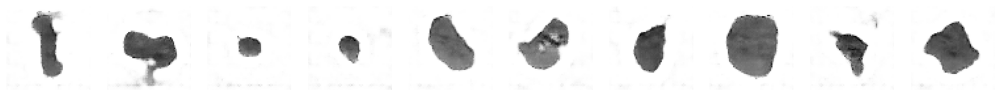

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - d_acc: 0.9162 - d_fake_acc: 0.9217 - d_loss: -0.0355 - d_real_acc: 0.9106 - g_acc: 0.0783 - g_loss: 5.8429
Epoch 26/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9191 - d_fake_acc: 0.9198 - d_loss: -0.0422 - d_real_acc: 0.9184 - g_acc: 0.0802 - g_loss: 5.9677
Saved to ./output/generated_img_025.png


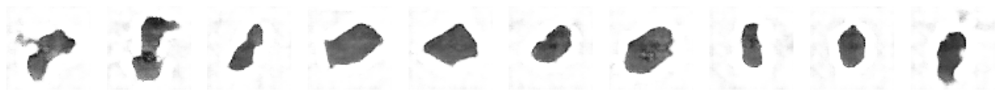

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9187 - d_fake_acc: 0.9193 - d_loss: -0.0399 - d_real_acc: 0.9180 - g_acc: 0.0807 - g_loss: 5.9656
Epoch 27/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9593 - d_fake_acc: 0.9605 - d_loss: -0.2220 - d_real_acc: 0.9582 - g_acc: 0.0395 - g_loss: 7.0448
Saved to ./output/generated_img_026.png


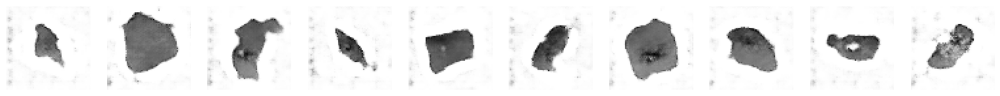

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9589 - d_fake_acc: 0.9600 - d_loss: -0.2204 - d_real_acc: 0.9578 - g_acc: 0.0400 - g_loss: 7.0506
Epoch 28/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9140 - d_fake_acc: 0.9226 - d_loss: -0.0112 - d_real_acc: 0.9054 - g_acc: 0.0774 - g_loss: 5.0250
Saved to ./output/generated_img_027.png


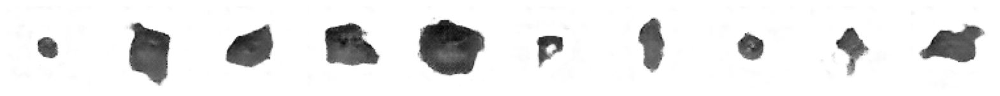

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9140 - d_fake_acc: 0.9224 - d_loss: -0.0105 - d_real_acc: 0.9055 - g_acc: 0.0776 - g_loss: 5.0434
Epoch 29/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9169 - d_fake_acc: 0.9112 - d_loss: -0.0835 - d_real_acc: 0.9225 - g_acc: 0.0888 - g_loss: 6.0065
Saved to ./output/generated_img_028.png


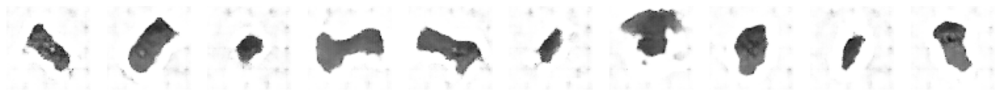

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9176 - d_fake_acc: 0.9120 - d_loss: -0.0856 - d_real_acc: 0.9231 - g_acc: 0.0880 - g_loss: 6.0169
Epoch 30/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9345 - d_fake_acc: 0.9368 - d_loss: -0.1079 - d_real_acc: 0.9321 - g_acc: 0.0632 - g_loss: 6.5191
Saved to ./output/generated_img_029.png


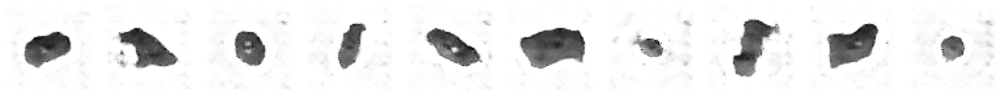

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - d_acc: 0.9341 - d_fake_acc: 0.9365 - d_loss: -0.1063 - d_real_acc: 0.9317 - g_acc: 0.0635 - g_loss: 6.5128
Epoch 31/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9185 - d_fake_acc: 0.9193 - d_loss: -0.0845 - d_real_acc: 0.9178 - g_acc: 0.0807 - g_loss: 7.4037
Saved to ./output/generated_img_030.png


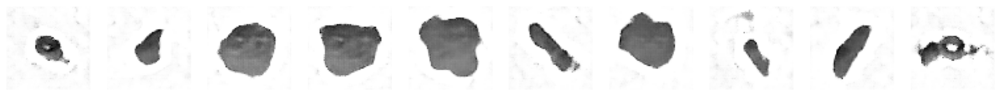

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9184 - d_fake_acc: 0.9191 - d_loss: -0.0840 - d_real_acc: 0.9176 - g_acc: 0.0809 - g_loss: 7.3962
Epoch 32/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9358 - d_fake_acc: 0.9378 - d_loss: -0.1393 - d_real_acc: 0.9338 - g_acc: 0.0622 - g_loss: 7.0346
Saved to ./output/generated_img_031.png


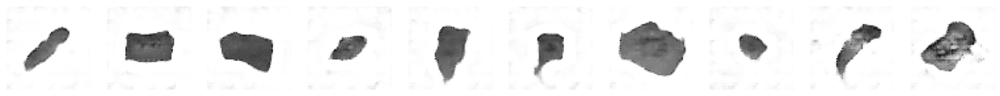

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9353 - d_fake_acc: 0.9373 - d_loss: -0.1366 - d_real_acc: 0.9333 - g_acc: 0.0627 - g_loss: 7.0280
Epoch 33/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9392 - d_fake_acc: 0.9296 - d_loss: -0.1609 - d_real_acc: 0.9487 - g_acc: 0.0704 - g_loss: 6.3212
Saved to ./output/generated_img_032.png


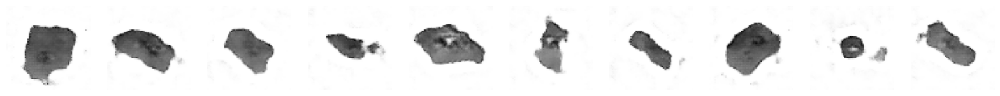

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9391 - d_fake_acc: 0.9297 - d_loss: -0.1608 - d_real_acc: 0.9485 - g_acc: 0.0703 - g_loss: 6.3284
Epoch 34/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9472 - d_fake_acc: 0.9450 - d_loss: -0.1820 - d_real_acc: 0.9495 - g_acc: 0.0550 - g_loss: 7.8358
Saved to ./output/generated_img_033.png


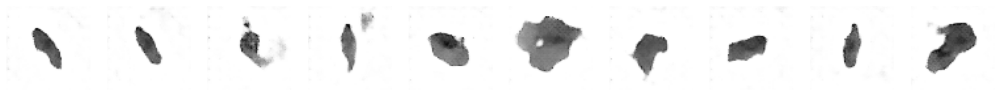

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9462 - d_fake_acc: 0.9440 - d_loss: -0.1773 - d_real_acc: 0.9485 - g_acc: 0.0560 - g_loss: 7.8226
Epoch 35/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9060 - d_fake_acc: 0.9042 - d_loss: 0.0517 - d_real_acc: 0.9078 - g_acc: 0.0958 - g_loss: 5.9810
Saved to ./output/generated_img_034.png


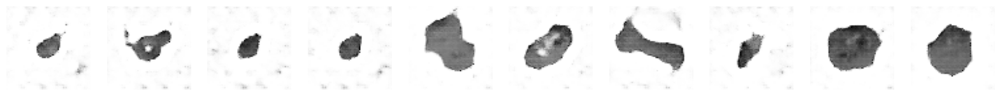

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9066 - d_fake_acc: 0.9048 - d_loss: 0.0490 - d_real_acc: 0.9083 - g_acc: 0.0952 - g_loss: 5.9881
Epoch 36/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9727 - d_fake_acc: 0.9743 - d_loss: -0.2605 - d_real_acc: 0.9711 - g_acc: 0.0257 - g_loss: 7.4205
Saved to ./output/generated_img_035.png


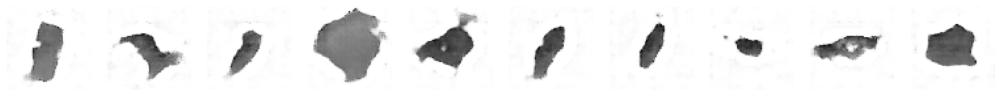

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9723 - d_fake_acc: 0.9739 - d_loss: -0.2585 - d_real_acc: 0.9707 - g_acc: 0.0261 - g_loss: 7.4172
Epoch 37/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9279 - d_fake_acc: 0.9274 - d_loss: -0.0599 - d_real_acc: 0.9285 - g_acc: 0.0726 - g_loss: 6.7083
Saved to ./output/generated_img_036.png


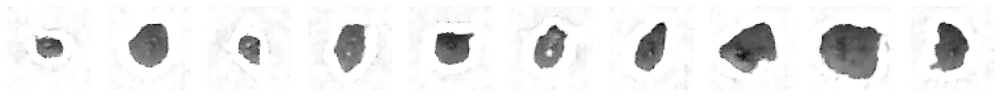

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9277 - d_fake_acc: 0.9271 - d_loss: -0.0588 - d_real_acc: 0.9282 - g_acc: 0.0729 - g_loss: 6.6988
Epoch 38/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9267 - d_fake_acc: 0.9265 - d_loss: -0.1119 - d_real_acc: 0.9269 - g_acc: 0.0735 - g_loss: 7.0208
Saved to ./output/generated_img_037.png


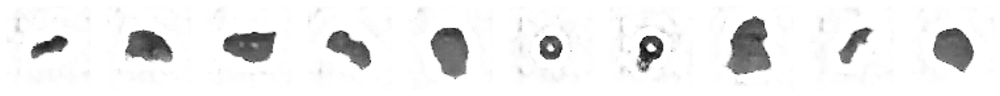

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9270 - d_fake_acc: 0.9267 - d_loss: -0.1129 - d_real_acc: 0.9272 - g_acc: 0.0733 - g_loss: 7.0267
Epoch 39/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9387 - d_fake_acc: 0.9392 - d_loss: -0.1360 - d_real_acc: 0.9383 - g_acc: 0.0608 - g_loss: 7.4543
Saved to ./output/generated_img_038.png


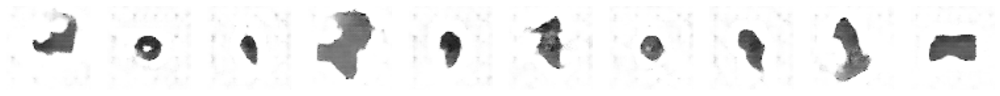

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9389 - d_fake_acc: 0.9393 - d_loss: -0.1368 - d_real_acc: 0.9385 - g_acc: 0.0607 - g_loss: 7.4528
Epoch 40/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.8259 - d_fake_acc: 0.8511 - d_loss: 0.5026 - d_real_acc: 0.8009 - g_acc: 0.1489 - g_loss: 5.7928
Saved to ./output/generated_img_039.png


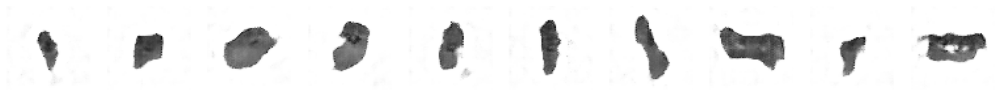

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.8266 - d_fake_acc: 0.8514 - d_loss: 0.4983 - d_real_acc: 0.8018 - g_acc: 0.1486 - g_loss: 5.7968
Epoch 41/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.8856 - d_fake_acc: 0.8629 - d_loss: 0.0763 - d_real_acc: 0.9083 - g_acc: 0.1371 - g_loss: 5.5986
Saved to ./output/generated_img_040.png


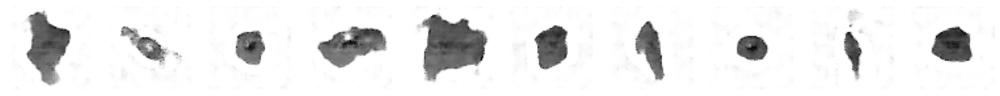

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.8860 - d_fake_acc: 0.8636 - d_loss: 0.0750 - d_real_acc: 0.9084 - g_acc: 0.1364 - g_loss: 5.6064
Epoch 42/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9317 - d_fake_acc: 0.9453 - d_loss: -0.1207 - d_real_acc: 0.9181 - g_acc: 0.0547 - g_loss: 6.6921
Saved to ./output/generated_img_041.png


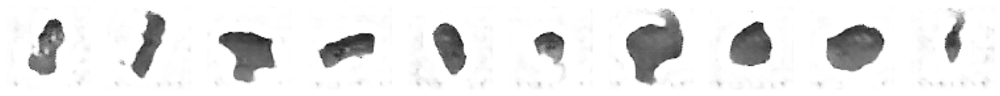

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9319 - d_fake_acc: 0.9453 - d_loss: -0.1211 - d_real_acc: 0.9185 - g_acc: 0.0547 - g_loss: 6.6905
Epoch 43/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9632 - d_fake_acc: 0.9626 - d_loss: -0.2573 - d_real_acc: 0.9638 - g_acc: 0.0374 - g_loss: 7.6078
Saved to ./output/generated_img_042.png


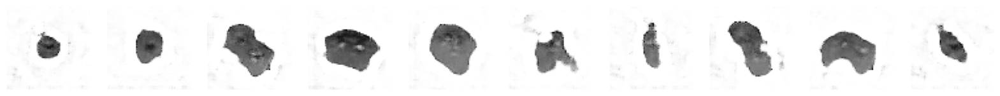

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - d_acc: 0.9629 - d_fake_acc: 0.9623 - d_loss: -0.2557 - d_real_acc: 0.9634 - g_acc: 0.0377 - g_loss: 7.6039
Epoch 44/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9772 - d_fake_acc: 0.9792 - d_loss: -0.3156 - d_real_acc: 0.9753 - g_acc: 0.0208 - g_loss: 7.9206
Saved to ./output/generated_img_043.png


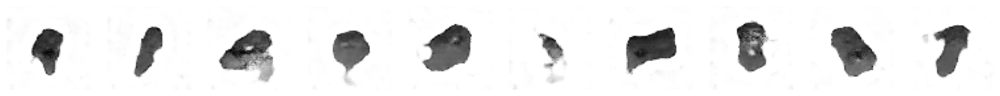

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9771 - d_fake_acc: 0.9790 - d_loss: -0.3155 - d_real_acc: 0.9752 - g_acc: 0.0210 - g_loss: 7.9235
Epoch 45/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9071 - d_fake_acc: 0.9042 - d_loss: 0.0196 - d_real_acc: 0.9100 - g_acc: 0.0958 - g_loss: 8.1628
Saved to ./output/generated_img_044.png


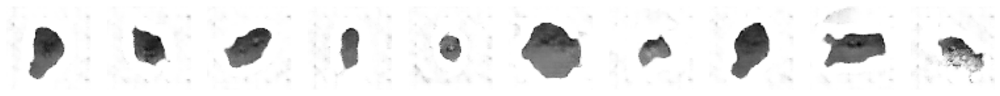

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - d_acc: 0.9069 - d_fake_acc: 0.9040 - d_loss: 0.0203 - d_real_acc: 0.9098 - g_acc: 0.0960 - g_loss: 8.1466
Epoch 46/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9597 - d_fake_acc: 0.9631 - d_loss: -0.2476 - d_real_acc: 0.9564 - g_acc: 0.0369 - g_loss: 7.6646
Saved to ./output/generated_img_045.png


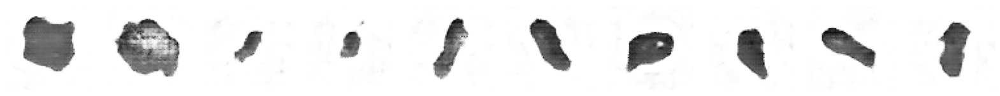

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9596 - d_fake_acc: 0.9630 - d_loss: -0.2476 - d_real_acc: 0.9563 - g_acc: 0.0370 - g_loss: 7.6768
Epoch 47/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9313 - d_fake_acc: 0.9235 - d_loss: -0.1709 - d_real_acc: 0.9391 - g_acc: 0.0765 - g_loss: 7.4656
Saved to ./output/generated_img_046.png


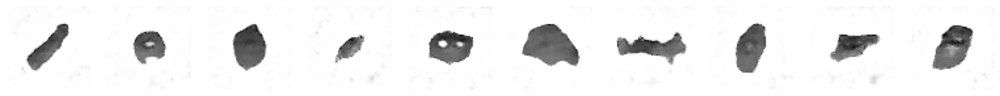

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9314 - d_fake_acc: 0.9237 - d_loss: -0.1707 - d_real_acc: 0.9391 - g_acc: 0.0763 - g_loss: 7.4660
Epoch 48/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9826 - d_fake_acc: 0.9839 - d_loss: -0.3514 - d_real_acc: 0.9813 - g_acc: 0.0161 - g_loss: 8.1780
Saved to ./output/generated_img_047.png


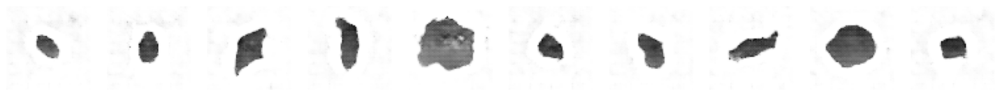

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9822 - d_fake_acc: 0.9836 - d_loss: -0.3497 - d_real_acc: 0.9808 - g_acc: 0.0164 - g_loss: 8.1900
Epoch 49/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.8930 - d_fake_acc: 0.8572 - d_loss: 0.1188 - d_real_acc: 0.9288 - g_acc: 0.1428 - g_loss: 6.8508
Saved to ./output/generated_img_048.png


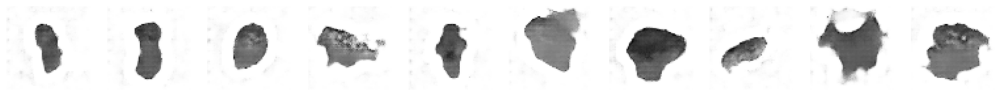

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.8936 - d_fake_acc: 0.8585 - d_loss: 0.1142 - d_real_acc: 0.9288 - g_acc: 0.1415 - g_loss: 6.8632
Epoch 50/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9457 - d_fake_acc: 0.9391 - d_loss: -0.2349 - d_real_acc: 0.9523 - g_acc: 0.0609 - g_loss: 7.9146
Saved to ./output/generated_img_049.png


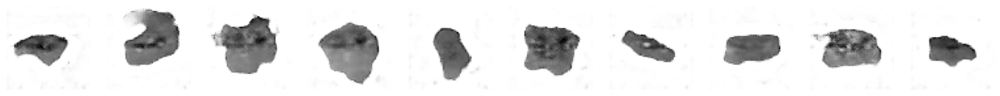

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9450 - d_fake_acc: 0.9387 - d_loss: -0.2312 - d_real_acc: 0.9515 - g_acc: 0.0613 - g_loss: 7.9090
Epoch 51/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.8713 - d_fake_acc: 0.8392 - d_loss: 0.2351 - d_real_acc: 0.9033 - g_acc: 0.1608 - g_loss: 6.3152
Saved to ./output/generated_img_050.png


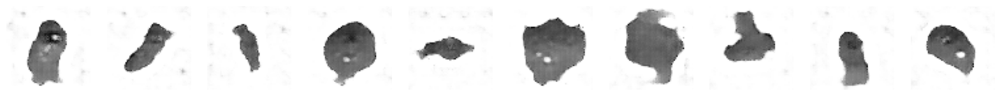

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.8726 - d_fake_acc: 0.8411 - d_loss: 0.2284 - d_real_acc: 0.9041 - g_acc: 0.1589 - g_loss: 6.3303
Epoch 52/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9869 - d_fake_acc: 0.9862 - d_loss: -0.3774 - d_real_acc: 0.9876 - g_acc: 0.0138 - g_loss: 8.5093
Saved to ./output/generated_img_051.png


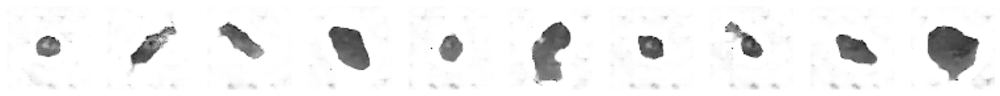

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9869 - d_fake_acc: 0.9862 - d_loss: -0.3778 - d_real_acc: 0.9876 - g_acc: 0.0138 - g_loss: 8.5169
Epoch 53/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.9557 - d_fake_acc: 0.9549 - d_loss: -0.2737 - d_real_acc: 0.9565 - g_acc: 0.0451 - g_loss: 9.0495
Saved to ./output/generated_img_052.png


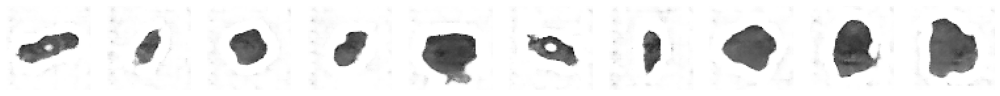

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.9550 - d_fake_acc: 0.9542 - d_loss: -0.2703 - d_real_acc: 0.9557 - g_acc: 0.0458 - g_loss: 9.0351
Epoch 54/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - d_acc: 0.8479 - d_fake_acc: 0.8501 - d_loss: 0.4222 - d_real_acc: 0.8457 - g_acc: 0.1499 - g_loss: 6.0360
Saved to ./output/generated_img_053.png


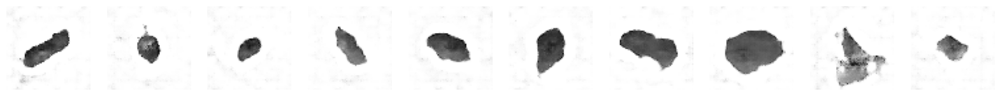

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - d_acc: 0.8488 - d_fake_acc: 0.8509 - d_loss: 0.4171 - d_real_acc: 0.8466 - g_acc: 0.1491 - g_loss: 6.0406
Epoch 55/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.8821 - d_fake_acc: 0.8814 - d_loss: 0.0925 - d_real_acc: 0.8828 - g_acc: 0.1186 - g_loss: 6.8903
Saved to ./output/generated_img_054.png


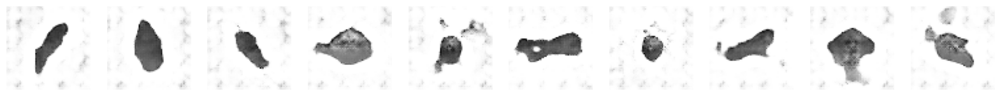

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.8829 - d_fake_acc: 0.8822 - d_loss: 0.0885 - d_real_acc: 0.8836 - g_acc: 0.1178 - g_loss: 6.9005
Epoch 56/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9494 - d_fake_acc: 0.9468 - d_loss: -0.1907 - d_real_acc: 0.9521 - g_acc: 0.0532 - g_loss: 7.4956
Saved to ./output/generated_img_055.png


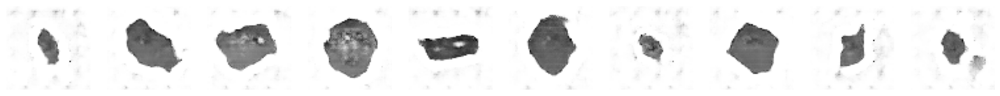

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9492 - d_fake_acc: 0.9466 - d_loss: -0.1896 - d_real_acc: 0.9518 - g_acc: 0.0534 - g_loss: 7.4936
Epoch 57/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - d_acc: 0.9773 - d_fake_acc: 0.9757 - d_loss: -0.3366 - d_real_acc: 0.9788 - g_acc: 0.0243 - g_loss: 8.3541
Saved to ./output/generated_img_056.png


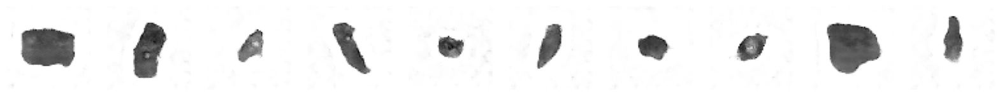

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - d_acc: 0.9767 - d_fake_acc: 0.9752 - d_loss: -0.3334 - d_real_acc: 0.9783 - g_acc: 0.0248 - g_loss: 8.3548
Epoch 58/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9613 - d_fake_acc: 0.9620 - d_loss: -0.2868 - d_real_acc: 0.9606 - g_acc: 0.0380 - g_loss: 7.9927
Saved to ./output/generated_img_057.png


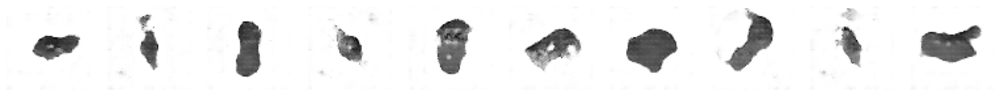

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9615 - d_fake_acc: 0.9621 - d_loss: -0.2878 - d_real_acc: 0.9608 - g_acc: 0.0379 - g_loss: 8.0054
Epoch 59/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.8460 - d_fake_acc: 0.8594 - d_loss: 0.3477 - d_real_acc: 0.8325 - g_acc: 0.1406 - g_loss: 6.9230
Saved to ./output/generated_img_058.png


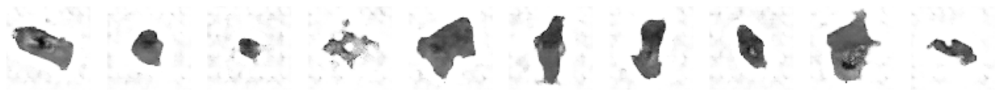

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.8463 - d_fake_acc: 0.8595 - d_loss: 0.3471 - d_real_acc: 0.8331 - g_acc: 0.1405 - g_loss: 6.9058
Epoch 60/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9098 - d_fake_acc: 0.9150 - d_loss: -0.0315 - d_real_acc: 0.9047 - g_acc: 0.0850 - g_loss: 5.5934
Saved to ./output/generated_img_059.png


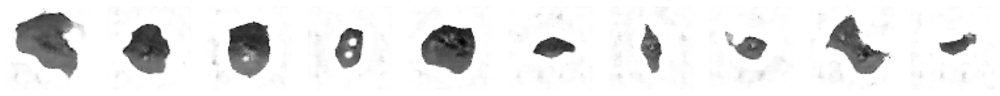

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.9101 - d_fake_acc: 0.9152 - d_loss: -0.0322 - d_real_acc: 0.9050 - g_acc: 0.0848 - g_loss: 5.6073
Epoch 61/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9829 - d_fake_acc: 0.9810 - d_loss: -0.3403 - d_real_acc: 0.9848 - g_acc: 0.0190 - g_loss: 7.8057
Saved to ./output/generated_img_060.png


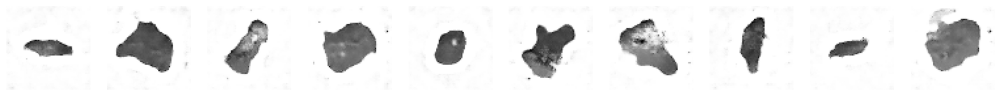

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9829 - d_fake_acc: 0.9811 - d_loss: -0.3408 - d_real_acc: 0.9847 - g_acc: 0.0189 - g_loss: 7.8173
Epoch 62/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9803 - d_fake_acc: 0.9790 - d_loss: -0.3798 - d_real_acc: 0.9816 - g_acc: 0.0210 - g_loss: 9.0188
Saved to ./output/generated_img_061.png


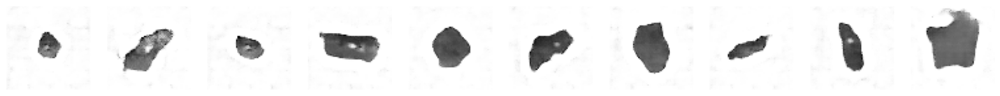

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9796 - d_fake_acc: 0.9784 - d_loss: -0.3767 - d_real_acc: 0.9809 - g_acc: 0.0216 - g_loss: 9.0232
Epoch 63/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9492 - d_fake_acc: 0.9535 - d_loss: -0.1844 - d_real_acc: 0.9449 - g_acc: 0.0465 - g_loss: 6.5822
Saved to ./output/generated_img_062.png


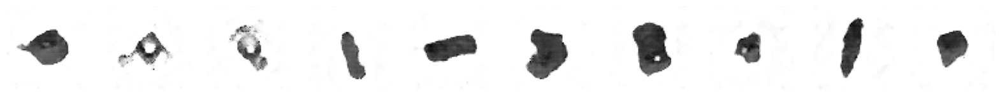

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9493 - d_fake_acc: 0.9535 - d_loss: -0.1855 - d_real_acc: 0.9451 - g_acc: 0.0465 - g_loss: 6.6005
Epoch 64/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.8787 - d_fake_acc: 0.8796 - d_loss: 0.2446 - d_real_acc: 0.8779 - g_acc: 0.1204 - g_loss: 8.4811
Saved to ./output/generated_img_063.png


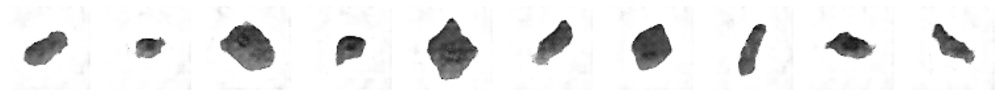

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.8778 - d_fake_acc: 0.8785 - d_loss: 0.2492 - d_real_acc: 0.8770 - g_acc: 0.1215 - g_loss: 8.4413
Epoch 65/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9369 - d_fake_acc: 0.9339 - d_loss: -0.1289 - d_real_acc: 0.9399 - g_acc: 0.0661 - g_loss: 6.0679
Saved to ./output/generated_img_064.png


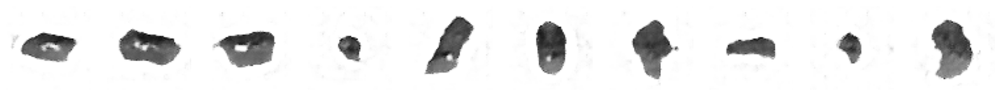

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9367 - d_fake_acc: 0.9339 - d_loss: -0.1286 - d_real_acc: 0.9396 - g_acc: 0.0661 - g_loss: 6.0808
Epoch 66/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9409 - d_fake_acc: 0.9355 - d_loss: -0.1874 - d_real_acc: 0.9463 - g_acc: 0.0645 - g_loss: 7.5546
Saved to ./output/generated_img_065.png


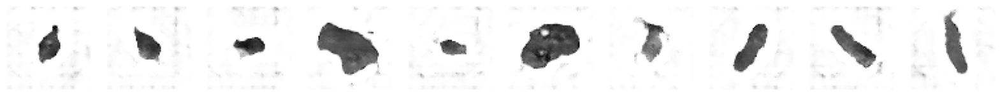

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9410 - d_fake_acc: 0.9356 - d_loss: -0.1874 - d_real_acc: 0.9463 - g_acc: 0.0644 - g_loss: 7.5560
Epoch 67/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9336 - d_fake_acc: 0.9426 - d_loss: -0.1817 - d_real_acc: 0.9247 - g_acc: 0.0574 - g_loss: 8.5458
Saved to ./output/generated_img_066.png


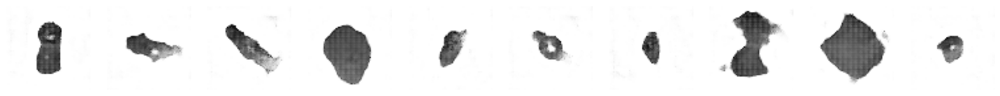

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9341 - d_fake_acc: 0.9430 - d_loss: -0.1842 - d_real_acc: 0.9253 - g_acc: 0.0570 - g_loss: 8.5555
Epoch 68/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9505 - d_fake_acc: 0.9507 - d_loss: -0.3620 - d_real_acc: 0.9504 - g_acc: 0.0493 - g_loss: 9.6047
Saved to ./output/generated_img_067.png


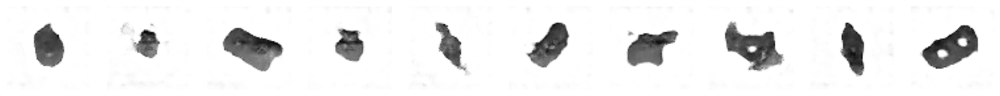

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9504 - d_fake_acc: 0.9506 - d_loss: -0.3612 - d_real_acc: 0.9502 - g_acc: 0.0494 - g_loss: 9.6028
Epoch 69/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.9361 - d_fake_acc: 0.9343 - d_loss: -0.1833 - d_real_acc: 0.9378 - g_acc: 0.0657 - g_loss: 8.1368
Saved to ./output/generated_img_068.png


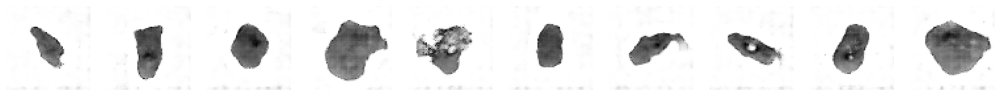

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - d_acc: 0.9349 - d_fake_acc: 0.9332 - d_loss: -0.1777 - d_real_acc: 0.9366 - g_acc: 0.0668 - g_loss: 8.1177
Epoch 70/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - d_acc: 0.9216 - d_fake_acc: 0.9084 - d_loss: -0.1097 - d_real_acc: 0.9348 - g_acc: 0.0916 - g_loss: 6.6739
Saved to ./output/generated_img_069.png


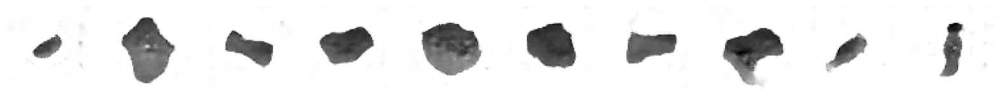

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - d_acc: 0.9222 - d_fake_acc: 0.9092 - d_loss: -0.1123 - d_real_acc: 0.9352 - g_acc: 0.0908 - g_loss: 6.6912
Epoch 71/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - d_acc: 0.9165 - d_fake_acc: 0.9172 - d_loss: -0.0748 - d_real_acc: 0.9159 - g_acc: 0.0828 - g_loss: 8.7787
Saved to ./output/generated_img_070.png


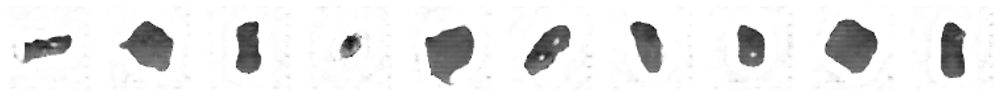

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - d_acc: 0.9167 - d_fake_acc: 0.9173 - d_loss: -0.0754 - d_real_acc: 0.9161 - g_acc: 0.0827 - g_loss: 8.7660
Epoch 72/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9694 - d_fake_acc: 0.9677 - d_loss: -0.3669 - d_real_acc: 0.9712 - g_acc: 0.0323 - g_loss: 9.3340
Saved to ./output/generated_img_071.png


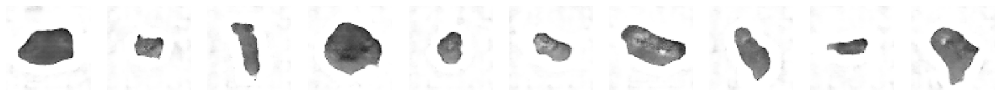

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9689 - d_fake_acc: 0.9671 - d_loss: -0.3642 - d_real_acc: 0.9706 - g_acc: 0.0329 - g_loss: 9.3242
Epoch 73/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.9172 - d_fake_acc: 0.9161 - d_loss: -0.0624 - d_real_acc: 0.9182 - g_acc: 0.0839 - g_loss: 6.6416
Saved to ./output/generated_img_072.png


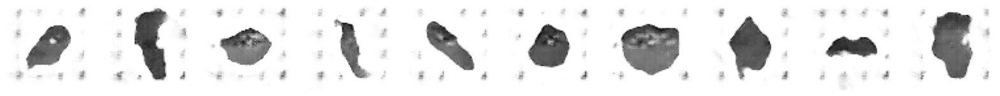

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.9174 - d_fake_acc: 0.9164 - d_loss: -0.0636 - d_real_acc: 0.9184 - g_acc: 0.0836 - g_loss: 6.6541
Epoch 74/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9859 - d_fake_acc: 0.9841 - d_loss: -0.3984 - d_real_acc: 0.9878 - g_acc: 0.0159 - g_loss: 9.2341
Saved to ./output/generated_img_073.png


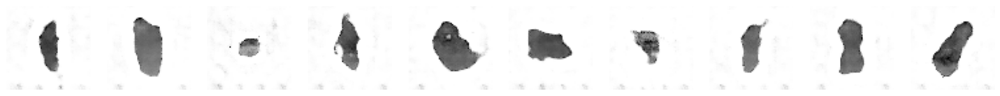

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9855 - d_fake_acc: 0.9837 - d_loss: -0.3963 - d_real_acc: 0.9874 - g_acc: 0.0163 - g_loss: 9.2297
Epoch 75/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9723 - d_fake_acc: 0.9665 - d_loss: -0.3097 - d_real_acc: 0.9780 - g_acc: 0.0335 - g_loss: 7.8010
Saved to ./output/generated_img_074.png


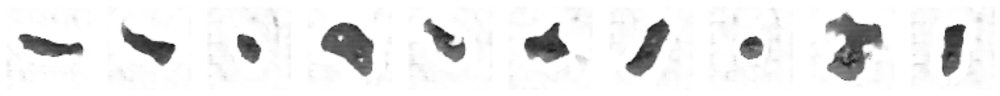

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9724 - d_fake_acc: 0.9667 - d_loss: -0.3110 - d_real_acc: 0.9781 - g_acc: 0.0333 - g_loss: 7.8234
Epoch 76/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9024 - d_fake_acc: 0.9038 - d_loss: 0.0415 - d_real_acc: 0.9009 - g_acc: 0.0962 - g_loss: 7.9558
Saved to ./output/generated_img_075.png


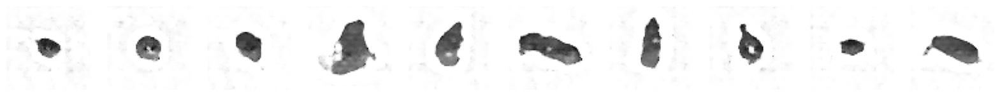

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9032 - d_fake_acc: 0.9047 - d_loss: 0.0364 - d_real_acc: 0.9018 - g_acc: 0.0953 - g_loss: 7.9723
Epoch 77/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9368 - d_fake_acc: 0.9370 - d_loss: -0.2127 - d_real_acc: 0.9366 - g_acc: 0.0630 - g_loss: 8.9117
Saved to ./output/generated_img_076.png


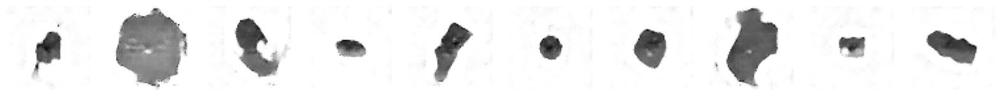

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9365 - d_fake_acc: 0.9367 - d_loss: -0.2103 - d_real_acc: 0.9362 - g_acc: 0.0633 - g_loss: 8.8944
Epoch 78/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.8977 - d_fake_acc: 0.8985 - d_loss: 0.1463 - d_real_acc: 0.8970 - g_acc: 0.1015 - g_loss: 7.1237
Saved to ./output/generated_img_077.png


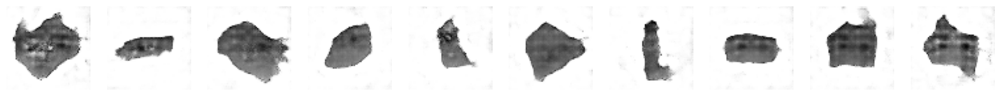

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.8976 - d_fake_acc: 0.8983 - d_loss: 0.1462 - d_real_acc: 0.8969 - g_acc: 0.1017 - g_loss: 7.1044
Epoch 79/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9414 - d_fake_acc: 0.9380 - d_loss: -0.2019 - d_real_acc: 0.9448 - g_acc: 0.0620 - g_loss: 7.3587
Saved to ./output/generated_img_078.png


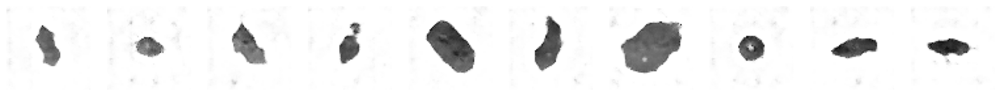

50/50 ━━━━━━━━━━━━━━━━━━━━ 20s 232ms/step - d_acc: 0.9417 - d_fake_acc: 0.9384 - d_loss: -0.2033 - d_real_acc: 0.9451 - g_acc: 0.0616 - g_loss: 7.3738
Epoch 80/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9597 - d_fake_acc: 0.9631 - d_loss: -0.3039 - d_real_acc: 0.9563 - g_acc: 0.0369 - g_loss: 9.3634
Saved to ./output/generated_img_079.png


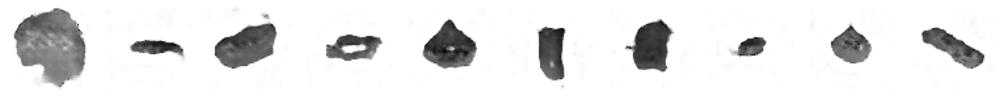

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9589 - d_fake_acc: 0.9623 - d_loss: -0.3000 - d_real_acc: 0.9556 - g_acc: 0.0377 - g_loss: 9.3408
Epoch 81/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9596 - d_fake_acc: 0.9591 - d_loss: -0.2743 - d_real_acc: 0.9601 - g_acc: 0.0409 - g_loss: 7.7608
Saved to ./output/generated_img_080.png


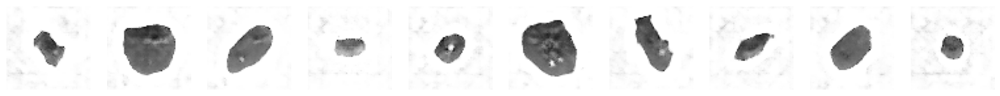

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9593 - d_fake_acc: 0.9588 - d_loss: -0.2729 - d_real_acc: 0.9598 - g_acc: 0.0412 - g_loss: 7.7656
Epoch 82/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9458 - d_fake_acc: 0.9405 - d_loss: -0.1708 - d_real_acc: 0.9511 - g_acc: 0.0595 - g_loss: 7.2537
Saved to ./output/generated_img_081.png


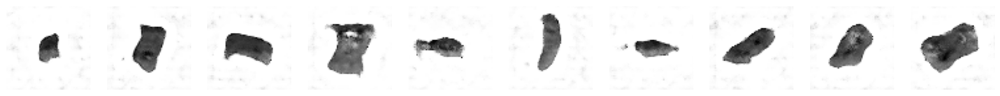

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9456 - d_fake_acc: 0.9404 - d_loss: -0.1693 - d_real_acc: 0.9507 - g_acc: 0.0596 - g_loss: 7.2486
Epoch 83/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9685 - d_fake_acc: 0.9690 - d_loss: -0.2848 - d_real_acc: 0.9680 - g_acc: 0.0310 - g_loss: 7.8238
Saved to ./output/generated_img_082.png


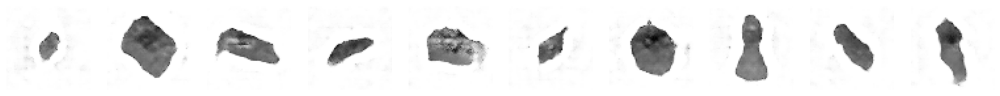

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9681 - d_fake_acc: 0.9687 - d_loss: -0.2830 - d_real_acc: 0.9676 - g_acc: 0.0313 - g_loss: 7.8351
Epoch 84/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - d_acc: 0.9751 - d_fake_acc: 0.9760 - d_loss: -0.3808 - d_real_acc: 0.9743 - g_acc: 0.0240 - g_loss: 9.0614
Saved to ./output/generated_img_083.png


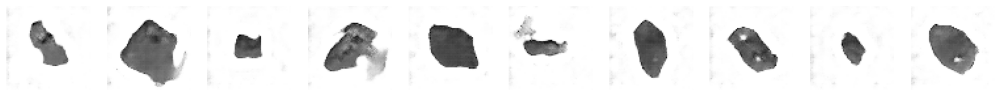

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.9747 - d_fake_acc: 0.9756 - d_loss: -0.3795 - d_real_acc: 0.9739 - g_acc: 0.0244 - g_loss: 9.0675
Epoch 85/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9704 - d_fake_acc: 0.9669 - d_loss: -0.3257 - d_real_acc: 0.9740 - g_acc: 0.0331 - g_loss: 8.2912
Saved to ./output/generated_img_084.png


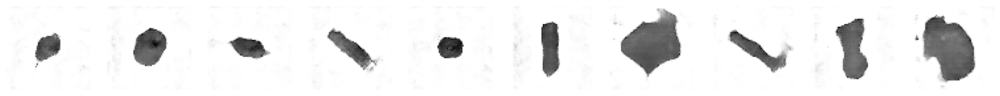

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9703 - d_fake_acc: 0.9667 - d_loss: -0.3257 - d_real_acc: 0.9738 - g_acc: 0.0333 - g_loss: 8.3091
Epoch 86/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9730 - d_fake_acc: 0.9721 - d_loss: -0.4113 - d_real_acc: 0.9739 - g_acc: 0.0279 - g_loss: 10.1934
Saved to ./output/generated_img_085.png


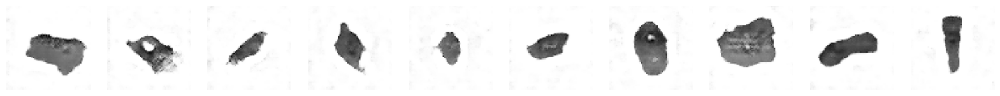

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9726 - d_fake_acc: 0.9717 - d_loss: -0.4091 - d_real_acc: 0.9735 - g_acc: 0.0283 - g_loss: 10.1793
Epoch 87/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9933 - d_fake_acc: 0.9918 - d_loss: -0.5163 - d_real_acc: 0.9949 - g_acc: 0.0082 - g_loss: 10.8666
Saved to ./output/generated_img_086.png


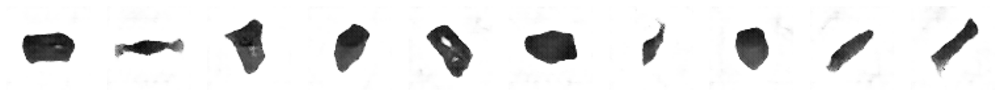

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9933 - d_fake_acc: 0.9918 - d_loss: -0.5178 - d_real_acc: 0.9949 - g_acc: 0.0082 - g_loss: 10.8959
Epoch 88/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.8888 - d_fake_acc: 0.8884 - d_loss: 0.0435 - d_real_acc: 0.8891 - g_acc: 0.1116 - g_loss: 10.2567
Saved to ./output/generated_img_087.png


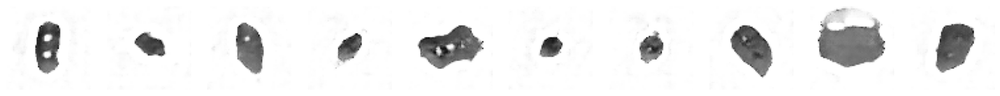

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - d_acc: 0.8889 - d_fake_acc: 0.8885 - d_loss: 0.0441 - d_real_acc: 0.8892 - g_acc: 0.1115 - g_loss: 10.2231
Epoch 89/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9357 - d_fake_acc: 0.9348 - d_loss: -0.1663 - d_real_acc: 0.9365 - g_acc: 0.0652 - g_loss: 8.6664
Saved to ./output/generated_img_088.png


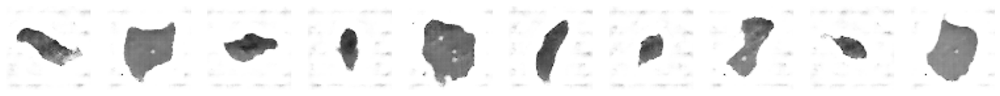

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9360 - d_fake_acc: 0.9352 - d_loss: -0.1676 - d_real_acc: 0.9368 - g_acc: 0.0648 - g_loss: 8.6603
Epoch 90/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9107 - d_fake_acc: 0.9125 - d_loss: 0.0542 - d_real_acc: 0.9089 - g_acc: 0.0875 - g_loss: 8.7832
Saved to ./output/generated_img_089.png


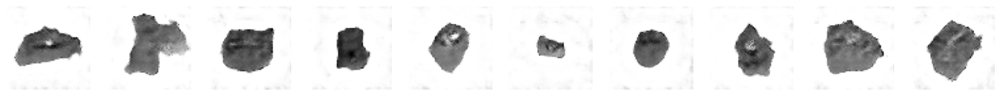

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9106 - d_fake_acc: 0.9124 - d_loss: 0.0542 - d_real_acc: 0.9088 - g_acc: 0.0876 - g_loss: 8.7580
Epoch 91/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9604 - d_fake_acc: 0.9573 - d_loss: -0.2682 - d_real_acc: 0.9635 - g_acc: 0.0427 - g_loss: 7.7103
Saved to ./output/generated_img_090.png


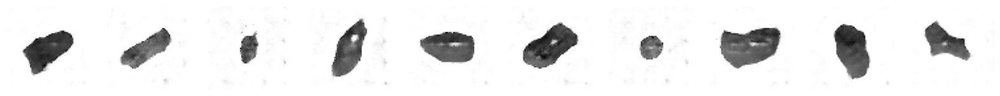

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9602 - d_fake_acc: 0.9572 - d_loss: -0.2667 - d_real_acc: 0.9631 - g_acc: 0.0428 - g_loss: 7.7243
Epoch 92/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9697 - d_fake_acc: 0.9668 - d_loss: -0.3501 - d_real_acc: 0.9726 - g_acc: 0.0332 - g_loss: 8.8097
Saved to ./output/generated_img_091.png


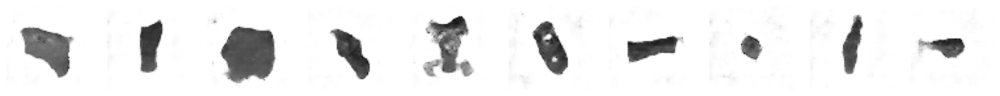

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9696 - d_fake_acc: 0.9668 - d_loss: -0.3503 - d_real_acc: 0.9725 - g_acc: 0.0332 - g_loss: 8.8178
Epoch 93/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9761 - d_fake_acc: 0.9746 - d_loss: -0.3894 - d_real_acc: 0.9775 - g_acc: 0.0254 - g_loss: 9.0392
Saved to ./output/generated_img_092.png


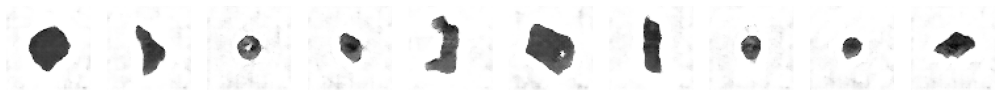

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9762 - d_fake_acc: 0.9748 - d_loss: -0.3906 - d_real_acc: 0.9776 - g_acc: 0.0252 - g_loss: 9.0578
Epoch 94/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9621 - d_fake_acc: 0.9677 - d_loss: -0.4283 - d_real_acc: 0.9565 - g_acc: 0.0323 - g_loss: 11.7831
Saved to ./output/generated_img_093.png


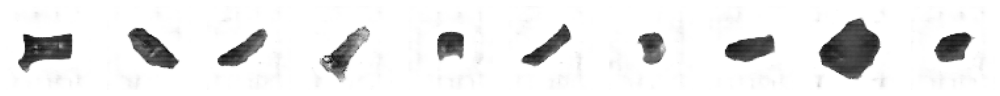

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9626 - d_fake_acc: 0.9681 - d_loss: -0.4312 - d_real_acc: 0.9570 - g_acc: 0.0319 - g_loss: 11.8059
Epoch 95/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9958 - d_fake_acc: 0.9954 - d_loss: -0.6812 - d_real_acc: 0.9962 - g_acc: 0.0046 - g_loss: 14.1255
Saved to ./output/generated_img_094.png


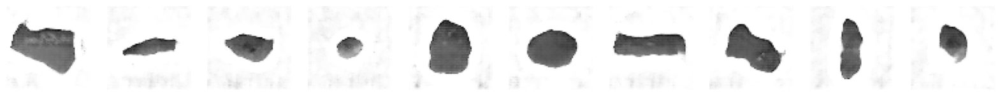

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9954 - d_fake_acc: 0.9950 - d_loss: -0.6788 - d_real_acc: 0.9957 - g_acc: 0.0050 - g_loss: 14.1231
Epoch 96/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.8095 - d_fake_acc: 0.8028 - d_loss: 0.8318 - d_real_acc: 0.8161 - g_acc: 0.1972 - g_loss: 6.7253
Saved to ./output/generated_img_095.png


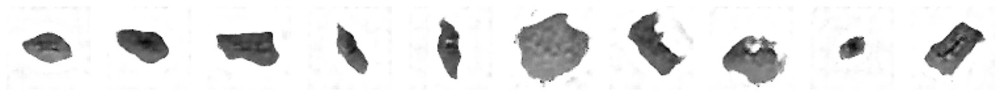

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.8113 - d_fake_acc: 0.8047 - d_loss: 0.8184 - d_real_acc: 0.8178 - g_acc: 0.1953 - g_loss: 6.7306
Epoch 97/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9733 - d_fake_acc: 0.9745 - d_loss: -0.3902 - d_real_acc: 0.9722 - g_acc: 0.0255 - g_loss: 9.4439
Saved to ./output/generated_img_096.png


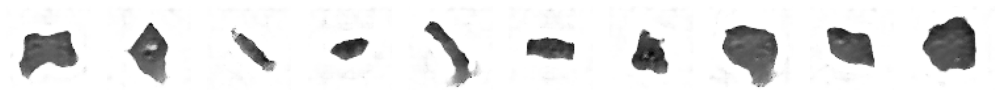

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - d_acc: 0.9735 - d_fake_acc: 0.9746 - d_loss: -0.3915 - d_real_acc: 0.9724 - g_acc: 0.0254 - g_loss: 9.4625
Epoch 98/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9250 - d_fake_acc: 0.9246 - d_loss: -0.1682 - d_real_acc: 0.9254 - g_acc: 0.0754 - g_loss: 8.4699
Saved to ./output/generated_img_097.png


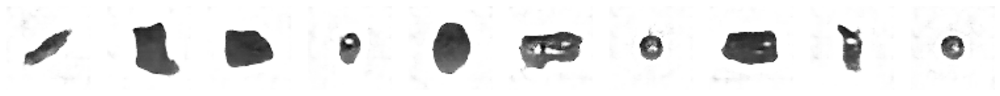

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9257 - d_fake_acc: 0.9253 - d_loss: -0.1720 - d_real_acc: 0.9261 - g_acc: 0.0747 - g_loss: 8.4964
Epoch 99/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9642 - d_fake_acc: 0.9637 - d_loss: -0.4108 - d_real_acc: 0.9648 - g_acc: 0.0363 - g_loss: 11.1899
Saved to ./output/generated_img_098.png


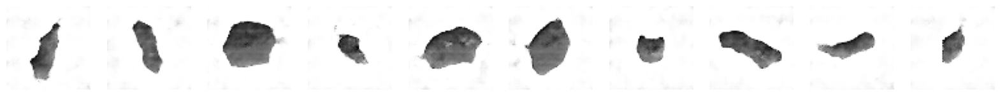

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9634 - d_fake_acc: 0.9629 - d_loss: -0.4059 - d_real_acc: 0.9640 - g_acc: 0.0371 - g_loss: 11.1517
Epoch 100/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9391 - d_fake_acc: 0.9389 - d_loss: -0.1647 - d_real_acc: 0.9393 - g_acc: 0.0611 - g_loss: 6.5574
Saved to ./output/generated_img_099.png


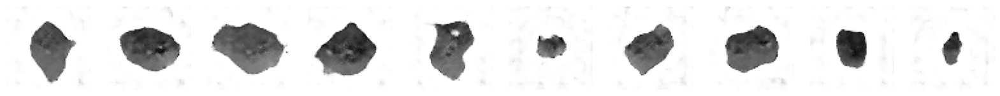

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9393 - d_fake_acc: 0.9391 - d_loss: -0.1657 - d_real_acc: 0.9394 - g_acc: 0.0609 - g_loss: 6.5695
Epoch 101/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - d_acc: 0.9823 - d_fake_acc: 0.9846 - d_loss: -0.4131 - d_real_acc: 0.9799 - g_acc: 0.0154 - g_loss: 9.9147
Saved to ./output/generated_img_100.png


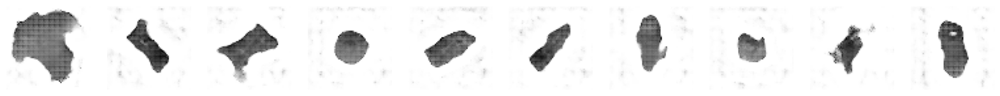

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - d_acc: 0.9823 - d_fake_acc: 0.9846 - d_loss: -0.4142 - d_real_acc: 0.9801 - g_acc: 0.0154 - g_loss: 9.9300
Epoch 102/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.8960 - d_fake_acc: 0.8982 - d_loss: 0.0222 - d_real_acc: 0.8937 - g_acc: 0.1018 - g_loss: 9.8274
Saved to ./output/generated_img_101.png


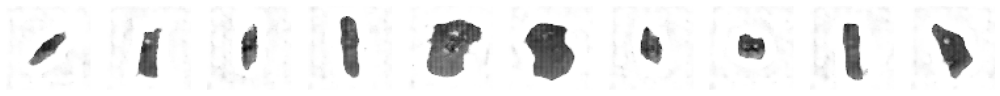

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.8956 - d_fake_acc: 0.8978 - d_loss: 0.0280 - d_real_acc: 0.8933 - g_acc: 0.1022 - g_loss: 9.8068
Epoch 103/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - d_acc: 0.8885 - d_fake_acc: 0.8845 - d_loss: 0.0532 - d_real_acc: 0.8924 - g_acc: 0.1155 - g_loss: 5.7036
Saved to ./output/generated_img_102.png


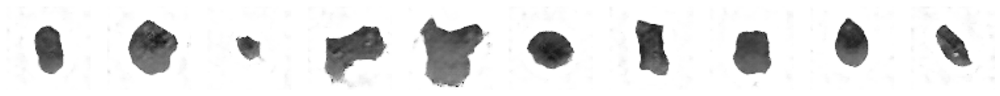

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - d_acc: 0.8890 - d_fake_acc: 0.8852 - d_loss: 0.0511 - d_real_acc: 0.8929 - g_acc: 0.1148 - g_loss: 5.7225
Epoch 104/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9728 - d_fake_acc: 0.9713 - d_loss: -0.3533 - d_real_acc: 0.9743 - g_acc: 0.0287 - g_loss: 8.9558
Saved to ./output/generated_img_103.png


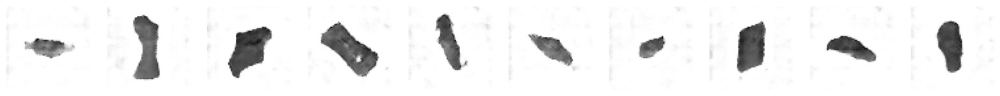

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9724 - d_fake_acc: 0.9709 - d_loss: -0.3513 - d_real_acc: 0.9739 - g_acc: 0.0291 - g_loss: 8.9564
Epoch 105/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9684 - d_fake_acc: 0.9657 - d_loss: -0.3413 - d_real_acc: 0.9711 - g_acc: 0.0343 - g_loss: 8.9248
Saved to ./output/generated_img_104.png


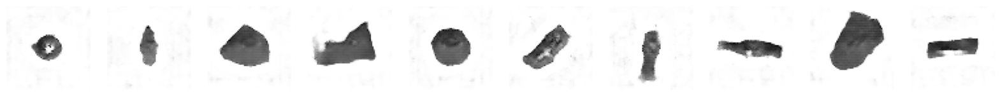

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9686 - d_fake_acc: 0.9659 - d_loss: -0.3426 - d_real_acc: 0.9713 - g_acc: 0.0341 - g_loss: 8.9437
Epoch 106/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9808 - d_fake_acc: 0.9798 - d_loss: -0.4607 - d_real_acc: 0.9818 - g_acc: 0.0202 - g_loss: 11.0352
Saved to ./output/generated_img_105.png


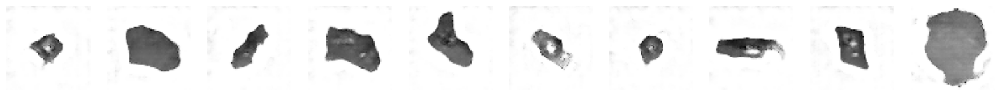

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9805 - d_fake_acc: 0.9795 - d_loss: -0.4583 - d_real_acc: 0.9815 - g_acc: 0.0205 - g_loss: 11.0189
Epoch 107/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9761 - d_fake_acc: 0.9761 - d_loss: -0.4352 - d_real_acc: 0.9761 - g_acc: 0.0239 - g_loss: 10.5756
Saved to ./output/generated_img_106.png


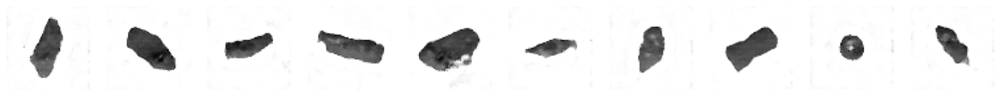

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9759 - d_fake_acc: 0.9759 - d_loss: -0.4343 - d_real_acc: 0.9759 - g_acc: 0.0241 - g_loss: 10.5684
Epoch 108/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9928 - d_fake_acc: 0.9926 - d_loss: -0.5378 - d_real_acc: 0.9930 - g_acc: 0.0074 - g_loss: 11.2706
Saved to ./output/generated_img_107.png


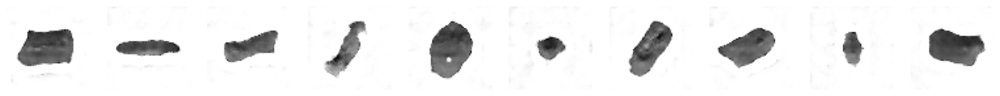

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9926 - d_fake_acc: 0.9924 - d_loss: -0.5373 - d_real_acc: 0.9928 - g_acc: 0.0076 - g_loss: 11.2735
Epoch 109/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9936 - d_fake_acc: 0.9940 - d_loss: -0.5827 - d_real_acc: 0.9932 - g_acc: 0.0060 - g_loss: 12.4313
Saved to ./output/generated_img_108.png


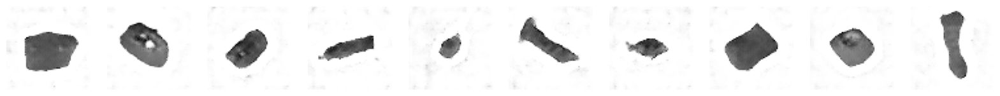

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9935 - d_fake_acc: 0.9939 - d_loss: -0.5829 - d_real_acc: 0.9931 - g_acc: 0.0061 - g_loss: 12.4316
Epoch 110/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9349 - d_fake_acc: 0.9402 - d_loss: -0.1579 - d_real_acc: 0.9297 - g_acc: 0.0598 - g_loss: 10.4102
Saved to ./output/generated_img_109.png


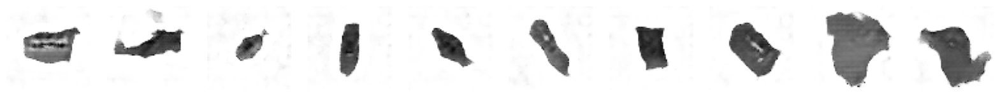

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9350 - d_fake_acc: 0.9402 - d_loss: -0.1586 - d_real_acc: 0.9298 - g_acc: 0.0598 - g_loss: 10.4023
Epoch 111/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9530 - d_fake_acc: 0.9523 - d_loss: -0.2358 - d_real_acc: 0.9536 - g_acc: 0.0477 - g_loss: 7.6786
Saved to ./output/generated_img_110.png


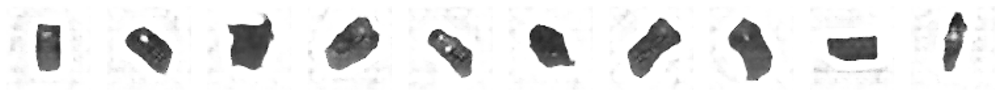

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9527 - d_fake_acc: 0.9521 - d_loss: -0.2349 - d_real_acc: 0.9533 - g_acc: 0.0479 - g_loss: 7.6943
Epoch 112/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9663 - d_fake_acc: 0.9647 - d_loss: -0.3142 - d_real_acc: 0.9678 - g_acc: 0.0353 - g_loss: 8.4146
Saved to ./output/generated_img_111.png


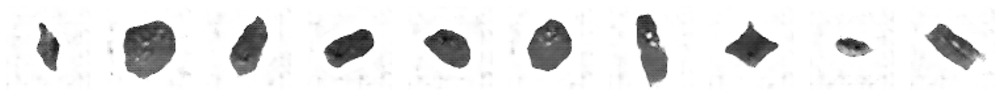

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9662 - d_fake_acc: 0.9647 - d_loss: -0.3148 - d_real_acc: 0.9677 - g_acc: 0.0353 - g_loss: 8.4328
Epoch 113/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9845 - d_fake_acc: 0.9835 - d_loss: -0.6296 - d_real_acc: 0.9855 - g_acc: 0.0165 - g_loss: 13.4844
Saved to ./output/generated_img_112.png


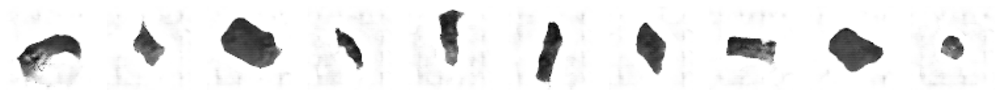

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9846 - d_fake_acc: 0.9836 - d_loss: -0.6312 - d_real_acc: 0.9857 - g_acc: 0.0164 - g_loss: 13.5050
Epoch 114/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9370 - d_fake_acc: 0.9423 - d_loss: -0.1408 - d_real_acc: 0.9316 - g_acc: 0.0577 - g_loss: 9.7929
Saved to ./output/generated_img_113.png


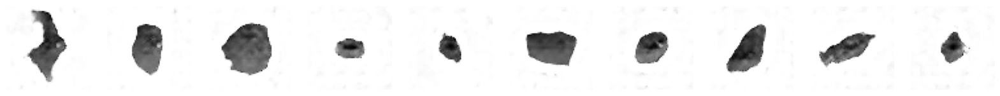

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9370 - d_fake_acc: 0.9423 - d_loss: -0.1403 - d_real_acc: 0.9317 - g_acc: 0.0577 - g_loss: 9.7690
Epoch 115/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9654 - d_fake_acc: 0.9658 - d_loss: -0.2944 - d_real_acc: 0.9650 - g_acc: 0.0342 - g_loss: 9.1915
Saved to ./output/generated_img_114.png


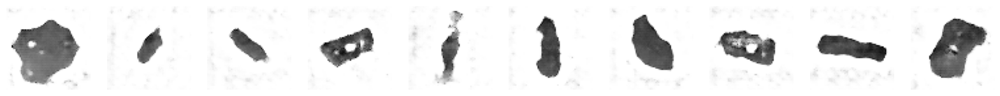

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9653 - d_fake_acc: 0.9657 - d_loss: -0.2935 - d_real_acc: 0.9649 - g_acc: 0.0343 - g_loss: 9.1845
Epoch 116/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9847 - d_fake_acc: 0.9856 - d_loss: -0.4312 - d_real_acc: 0.9837 - g_acc: 0.0144 - g_loss: 10.4397
Saved to ./output/generated_img_115.png


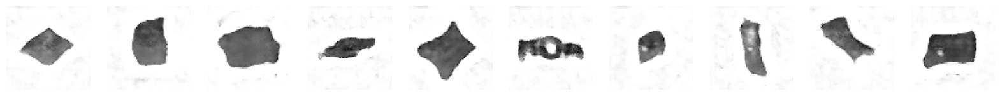

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 235ms/step - d_acc: 0.9841 - d_fake_acc: 0.9850 - d_loss: -0.4281 - d_real_acc: 0.9832 - g_acc: 0.0150 - g_loss: 10.4307
Epoch 117/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9384 - d_fake_acc: 0.9406 - d_loss: -0.2073 - d_real_acc: 0.9362 - g_acc: 0.0594 - g_loss: 7.9582
Saved to ./output/generated_img_116.png


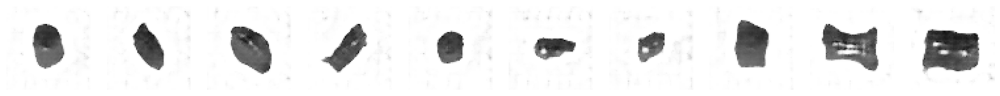

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9388 - d_fake_acc: 0.9409 - d_loss: -0.2094 - d_real_acc: 0.9366 - g_acc: 0.0591 - g_loss: 7.9784
Epoch 118/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9669 - d_fake_acc: 0.9665 - d_loss: -0.4369 - d_real_acc: 0.9672 - g_acc: 0.0335 - g_loss: 11.2674
Saved to ./output/generated_img_117.png


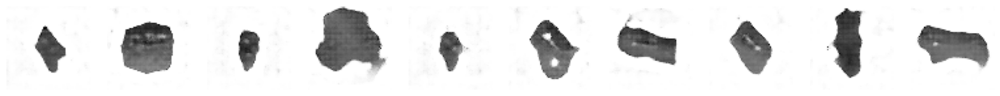

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9669 - d_fake_acc: 0.9665 - d_loss: -0.4366 - d_real_acc: 0.9672 - g_acc: 0.0335 - g_loss: 11.2589
Epoch 119/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9522 - d_fake_acc: 0.9538 - d_loss: -0.3724 - d_real_acc: 0.9507 - g_acc: 0.0462 - g_loss: 10.7925
Saved to ./output/generated_img_118.png


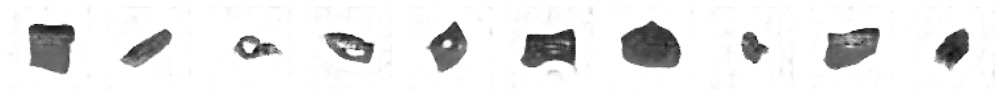

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9522 - d_fake_acc: 0.9537 - d_loss: -0.3713 - d_real_acc: 0.9507 - g_acc: 0.0463 - g_loss: 10.7684
Epoch 120/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9873 - d_fake_acc: 0.9864 - d_loss: -0.5756 - d_real_acc: 0.9882 - g_acc: 0.0136 - g_loss: 12.8427
Saved to ./output/generated_img_119.png


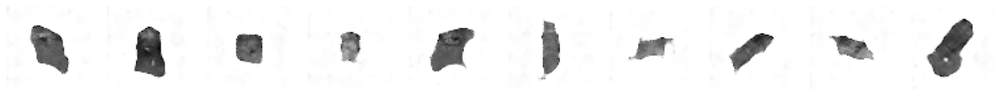

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9869 - d_fake_acc: 0.9860 - d_loss: -0.5724 - d_real_acc: 0.9878 - g_acc: 0.0140 - g_loss: 12.8346
Epoch 121/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9733 - d_fake_acc: 0.9722 - d_loss: -0.3347 - d_real_acc: 0.9744 - g_acc: 0.0278 - g_loss: 8.3934
Saved to ./output/generated_img_120.png


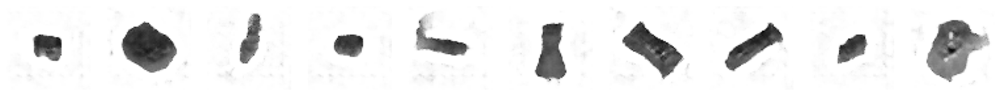

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9734 - d_fake_acc: 0.9723 - d_loss: -0.3361 - d_real_acc: 0.9745 - g_acc: 0.0277 - g_loss: 8.4145
Epoch 122/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9964 - d_fake_acc: 0.9950 - d_loss: -0.6323 - d_real_acc: 0.9977 - g_acc: 0.0050 - g_loss: 12.9527
Saved to ./output/generated_img_121.png


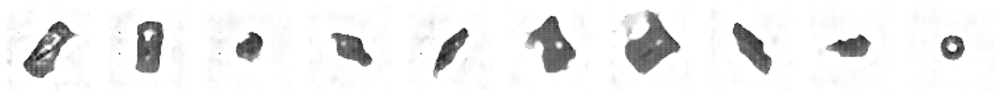

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9964 - d_fake_acc: 0.9951 - d_loss: -0.6333 - d_real_acc: 0.9977 - g_acc: 0.0049 - g_loss: 12.9730
Epoch 123/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9783 - d_fake_acc: 0.9788 - d_loss: -0.5783 - d_real_acc: 0.9777 - g_acc: 0.0212 - g_loss: 13.9530
Saved to ./output/generated_img_122.png


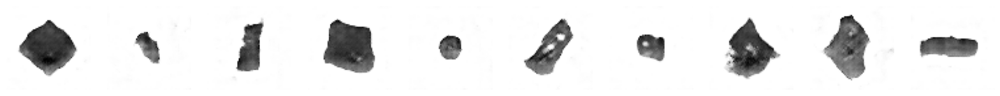

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9774 - d_fake_acc: 0.9780 - d_loss: -0.5719 - d_real_acc: 0.9768 - g_acc: 0.0220 - g_loss: 13.9226
Epoch 124/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9802 - d_fake_acc: 0.9755 - d_loss: -0.5032 - d_real_acc: 0.9849 - g_acc: 0.0245 - g_loss: 11.0713
Saved to ./output/generated_img_123.png


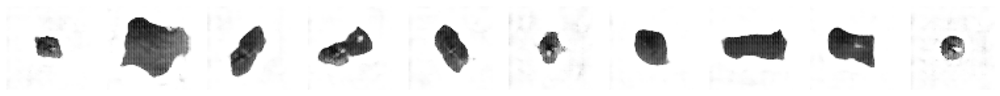

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9804 - d_fake_acc: 0.9758 - d_loss: -0.5059 - d_real_acc: 0.9850 - g_acc: 0.0242 - g_loss: 11.1171
Epoch 125/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9113 - d_fake_acc: 0.9154 - d_loss: 0.1267 - d_real_acc: 0.9073 - g_acc: 0.0846 - g_loss: 12.8274
Saved to ./output/generated_img_124.png


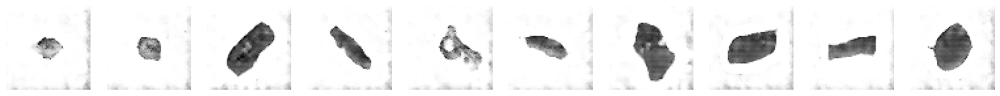

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9097 - d_fake_acc: 0.9137 - d_loss: 0.1395 - d_real_acc: 0.9056 - g_acc: 0.0863 - g_loss: 12.7527
Epoch 126/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.8679 - d_fake_acc: 0.8636 - d_loss: 0.1558 - d_real_acc: 0.8721 - g_acc: 0.1364 - g_loss: 5.3337
Saved to ./output/generated_img_125.png


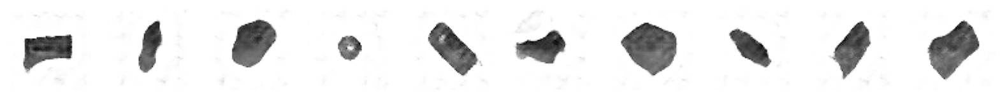

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.8683 - d_fake_acc: 0.8641 - d_loss: 0.1544 - d_real_acc: 0.8725 - g_acc: 0.1359 - g_loss: 5.3424
Epoch 127/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9522 - d_fake_acc: 0.9500 - d_loss: -0.2217 - d_real_acc: 0.9545 - g_acc: 0.0500 - g_loss: 7.0655
Saved to ./output/generated_img_126.png


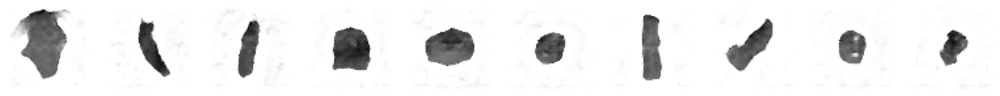

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9523 - d_fake_acc: 0.9501 - d_loss: -0.2227 - d_real_acc: 0.9546 - g_acc: 0.0499 - g_loss: 7.0793
Epoch 128/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9861 - d_fake_acc: 0.9859 - d_loss: -0.4778 - d_real_acc: 0.9864 - g_acc: 0.0141 - g_loss: 10.4606
Saved to ./output/generated_img_127.png


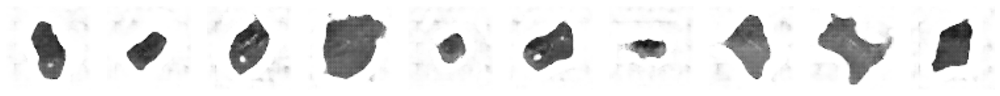

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9862 - d_fake_acc: 0.9860 - d_loss: -0.4792 - d_real_acc: 0.9865 - g_acc: 0.0140 - g_loss: 10.4848
Epoch 129/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.8323 - d_fake_acc: 0.8871 - d_loss: 1.1768 - d_real_acc: 0.7775 - g_acc: 0.1129 - g_loss: 9.5908
Saved to ./output/generated_img_128.png


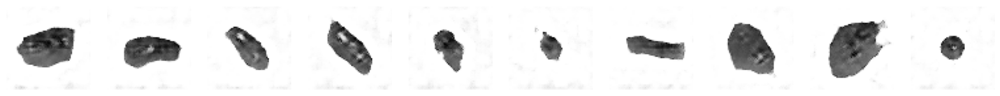

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.8333 - d_fake_acc: 0.8875 - d_loss: 1.1631 - d_real_acc: 0.7792 - g_acc: 0.1125 - g_loss: 9.5609
Epoch 130/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.8774 - d_fake_acc: 0.8961 - d_loss: 0.2380 - d_real_acc: 0.8586 - g_acc: 0.1039 - g_loss: 8.2757
Saved to ./output/generated_img_129.png


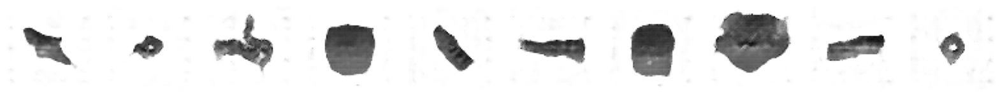

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.8788 - d_fake_acc: 0.8971 - d_loss: 0.2290 - d_real_acc: 0.8604 - g_acc: 0.1029 - g_loss: 8.2873
Epoch 131/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9774 - d_fake_acc: 0.9785 - d_loss: -0.5019 - d_real_acc: 0.9762 - g_acc: 0.0215 - g_loss: 12.0555
Saved to ./output/generated_img_130.png


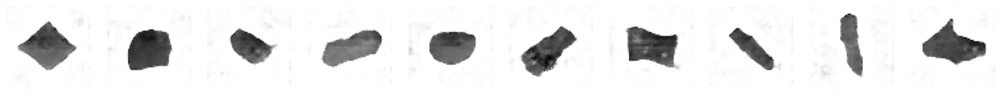

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9769 - d_fake_acc: 0.9780 - d_loss: -0.4985 - d_real_acc: 0.9758 - g_acc: 0.0220 - g_loss: 12.0132
Epoch 132/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9714 - d_fake_acc: 0.9724 - d_loss: -0.3405 - d_real_acc: 0.9703 - g_acc: 0.0276 - g_loss: 8.8502
Saved to ./output/generated_img_131.png


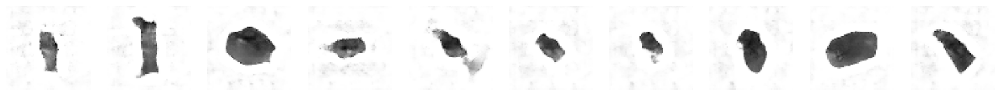

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9712 - d_fake_acc: 0.9723 - d_loss: -0.3408 - d_real_acc: 0.9702 - g_acc: 0.0277 - g_loss: 8.8608
Epoch 133/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9819 - d_fake_acc: 0.9807 - d_loss: -0.5152 - d_real_acc: 0.9832 - g_acc: 0.0193 - g_loss: 11.5075
Saved to ./output/generated_img_132.png


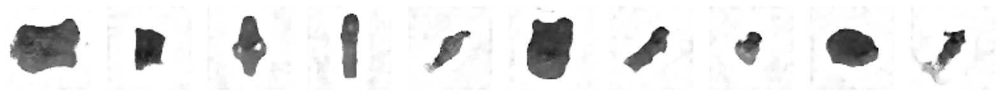

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9817 - d_fake_acc: 0.9805 - d_loss: -0.5145 - d_real_acc: 0.9830 - g_acc: 0.0195 - g_loss: 11.5079
Epoch 134/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9857 - d_fake_acc: 0.9854 - d_loss: -0.4661 - d_real_acc: 0.9860 - g_acc: 0.0146 - g_loss: 10.3292
Saved to ./output/generated_img_133.png


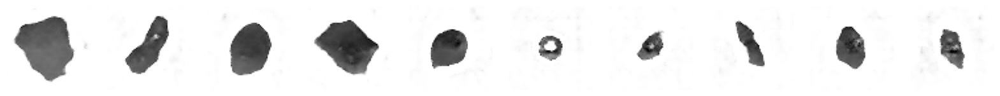

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9858 - d_fake_acc: 0.9855 - d_loss: -0.4673 - d_real_acc: 0.9861 - g_acc: 0.0145 - g_loss: 10.3489
Epoch 135/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - d_acc: 0.9790 - d_fake_acc: 0.9786 - d_loss: -0.5469 - d_real_acc: 0.9794 - g_acc: 0.0214 - g_loss: 12.4217
Saved to ./output/generated_img_134.png


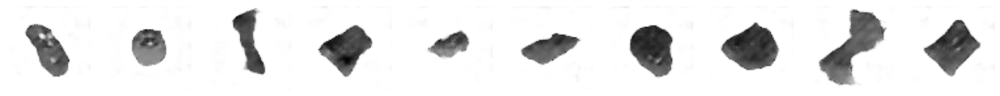

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - d_acc: 0.9787 - d_fake_acc: 0.9783 - d_loss: -0.5443 - d_real_acc: 0.9791 - g_acc: 0.0217 - g_loss: 12.3988
Epoch 136/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.9718 - d_fake_acc: 0.9715 - d_loss: -0.3488 - d_real_acc: 0.9721 - g_acc: 0.0285 - g_loss: 9.4246
Saved to ./output/generated_img_135.png


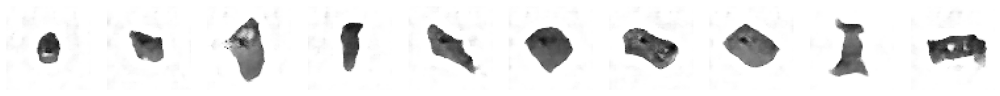

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9713 - d_fake_acc: 0.9710 - d_loss: -0.3455 - d_real_acc: 0.9716 - g_acc: 0.0290 - g_loss: 9.4240
Epoch 137/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - d_acc: 0.9574 - d_fake_acc: 0.9586 - d_loss: -0.2543 - d_real_acc: 0.9563 - g_acc: 0.0414 - g_loss: 8.0852
Saved to ./output/generated_img_136.png


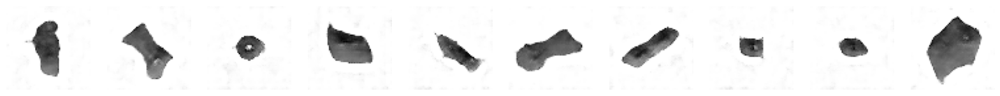

50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - d_acc: 0.9572 - d_fake_acc: 0.9584 - d_loss: -0.2537 - d_real_acc: 0.9561 - g_acc: 0.0416 - g_loss: 8.0901
Epoch 138/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9886 - d_fake_acc: 0.9872 - d_loss: -0.5156 - d_real_acc: 0.9899 - g_acc: 0.0128 - g_loss: 10.7674
Saved to ./output/generated_img_137.png


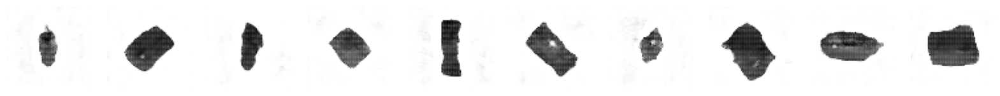

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 230ms/step - d_acc: 0.9886 - d_fake_acc: 0.9873 - d_loss: -0.5173 - d_real_acc: 0.9900 - g_acc: 0.0127 - g_loss: 10.8028
Epoch 139/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - d_acc: 0.9636 - d_fake_acc: 0.9681 - d_loss: -0.5161 - d_real_acc: 0.9591 - g_acc: 0.0319 - g_loss: 12.9205
Saved to ./output/generated_img_138.png


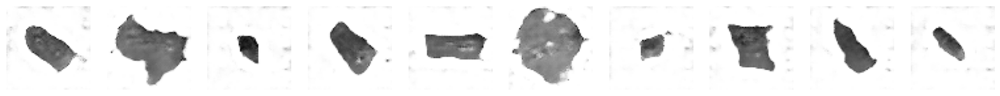

50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - d_acc: 0.9629 - d_fake_acc: 0.9674 - d_loss: -0.5108 - d_real_acc: 0.9584 - g_acc: 0.0326 - g_loss: 12.8630
Epoch 140/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9415 - d_fake_acc: 0.9398 - d_loss: -0.1315 - d_real_acc: 0.9431 - g_acc: 0.0602 - g_loss: 7.8128
Saved to ./output/generated_img_139.png


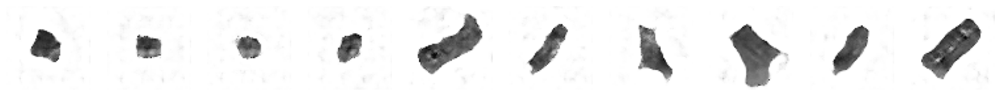

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9413 - d_fake_acc: 0.9397 - d_loss: -0.1302 - d_real_acc: 0.9429 - g_acc: 0.0603 - g_loss: 7.8141
Epoch 141/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - d_acc: 0.9882 - d_fake_acc: 0.9873 - d_loss: -0.4476 - d_real_acc: 0.9891 - g_acc: 0.0127 - g_loss: 9.6151
Saved to ./output/generated_img_140.png


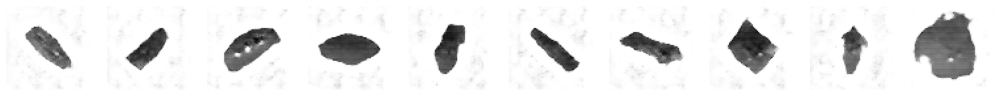

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9883 - d_fake_acc: 0.9874 - d_loss: -0.4482 - d_real_acc: 0.9892 - g_acc: 0.0126 - g_loss: 9.6277
Epoch 142/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - d_acc: 0.8949 - d_fake_acc: 0.8944 - d_loss: 0.1855 - d_real_acc: 0.8954 - g_acc: 0.1056 - g_loss: 8.4355
Saved to ./output/generated_img_141.png


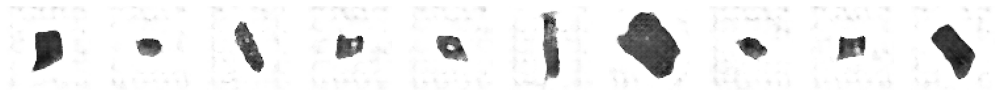

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step - d_acc: 0.8960 - d_fake_acc: 0.8955 - d_loss: 0.1780 - d_real_acc: 0.8965 - g_acc: 0.1045 - g_loss: 8.4507
Epoch 143/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9554 - d_fake_acc: 0.9558 - d_loss: -0.3334 - d_real_acc: 0.9550 - g_acc: 0.0442 - g_loss: 10.5722
Saved to ./output/generated_img_142.png


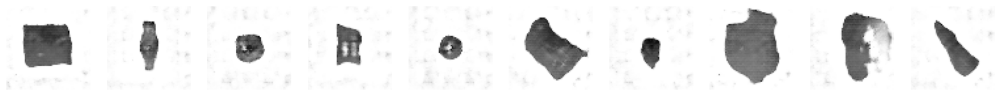

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9555 - d_fake_acc: 0.9559 - d_loss: -0.3334 - d_real_acc: 0.9550 - g_acc: 0.0441 - g_loss: 10.5665
Epoch 144/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - d_acc: 0.9463 - d_fake_acc: 0.9480 - d_loss: -0.2021 - d_real_acc: 0.9445 - g_acc: 0.0520 - g_loss: 10.8733
Saved to ./output/generated_img_143.png


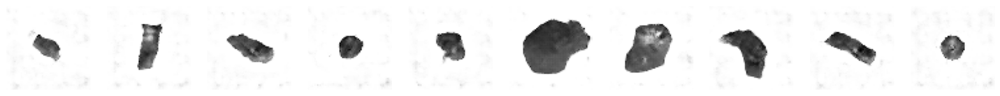

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 232ms/step - d_acc: 0.9466 - d_fake_acc: 0.9483 - d_loss: -0.2048 - d_real_acc: 0.9449 - g_acc: 0.0517 - g_loss: 10.8752
Epoch 145/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9957 - d_fake_acc: 0.9932 - d_loss: -0.6400 - d_real_acc: 0.9982 - g_acc: 0.0068 - g_loss: 13.5703
Saved to ./output/generated_img_144.png


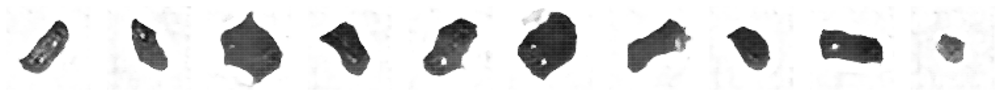

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - d_acc: 0.9958 - d_fake_acc: 0.9933 - d_loss: -0.6413 - d_real_acc: 0.9982 - g_acc: 0.0067 - g_loss: 13.5892
Epoch 146/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - d_acc: 0.9885 - d_fake_acc: 0.9901 - d_loss: -0.6455 - d_real_acc: 0.9869 - g_acc: 0.0099 - g_loss: 14.5267
Saved to ./output/generated_img_145.png


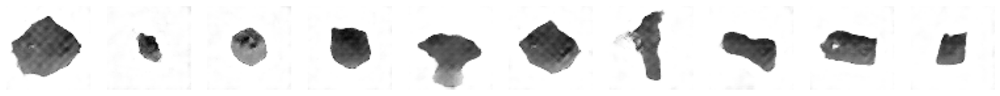

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 231ms/step - d_acc: 0.9880 - d_fake_acc: 0.9896 - d_loss: -0.6407 - d_real_acc: 0.9863 - g_acc: 0.0104 - g_loss: 14.4960
Epoch 147/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - d_acc: 0.9758 - d_fake_acc: 0.9731 - d_loss: -0.3939 - d_real_acc: 0.9786 - g_acc: 0.0269 - g_loss: 9.5503
Saved to ./output/generated_img_146.png


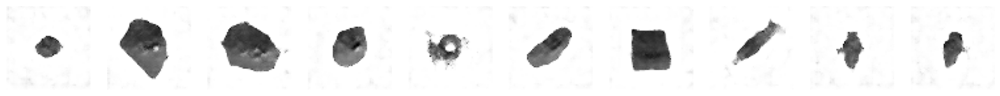

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 234ms/step - d_acc: 0.9760 - d_fake_acc: 0.9732 - d_loss: -0.3951 - d_real_acc: 0.9787 - g_acc: 0.0268 - g_loss: 9.5680
Epoch 148/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - d_acc: 0.9967 - d_fake_acc: 0.9972 - d_loss: -0.6745 - d_real_acc: 0.9962 - g_acc: 0.0028 - g_loss: 13.9600
Saved to ./output/generated_img_147.png


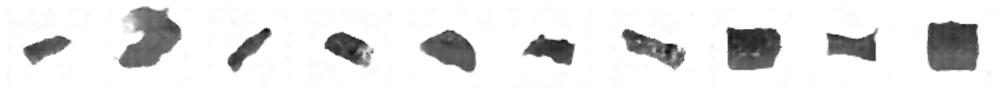

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 236ms/step - d_acc: 0.9967 - d_fake_acc: 0.9972 - d_loss: -0.6746 - d_real_acc: 0.9962 - g_acc: 0.0028 - g_loss: 13.9614
Epoch 149/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - d_acc: 0.9920 - d_fake_acc: 0.9912 - d_loss: -0.6718 - d_real_acc: 0.9928 - g_acc: 0.0088 - g_loss: 13.9417
Saved to ./output/generated_img_148.png


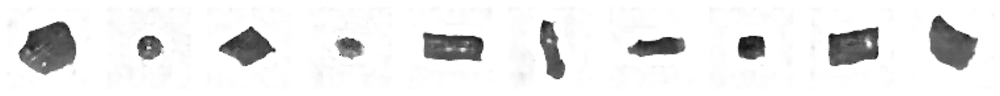

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 239ms/step - d_acc: 0.9920 - d_fake_acc: 0.9912 - d_loss: -0.6719 - d_real_acc: 0.9928 - g_acc: 0.0088 - g_loss: 13.9447
Epoch 150/150
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - d_acc: 0.9634 - d_fake_acc: 0.9663 - d_loss: -0.4467 - d_real_acc: 0.9605 - g_acc: 0.0337 - g_loss: 11.5352
Saved to ./output/generated_img_149.png


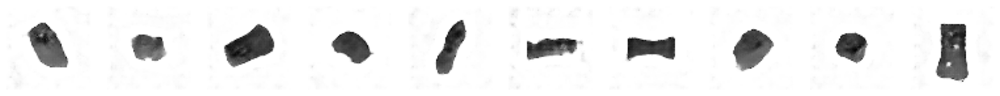

50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 237ms/step - d_acc: 0.9635 - d_fake_acc: 0.9663 - d_loss: -0.4463 - d_real_acc: 0.9606 - g_acc: 0.0337 - g_loss: 11.5273


In [37]:
dcgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        #model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [ ]:
# Save the final models
generator.save("./models/generator")
discriminator.save("./models/discriminator")

## 4. Generate new images <a name="decode"></a>

In [38]:
# Sample some points in the latent space, from the standard normal distribution
grid_width, grid_height = (10, 3)
z_sample = np.random.normal(size=(grid_width * grid_height, Z_DIM))

In [39]:
# Decode the sampled points
reconstructions = generator.predict(z_sample)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


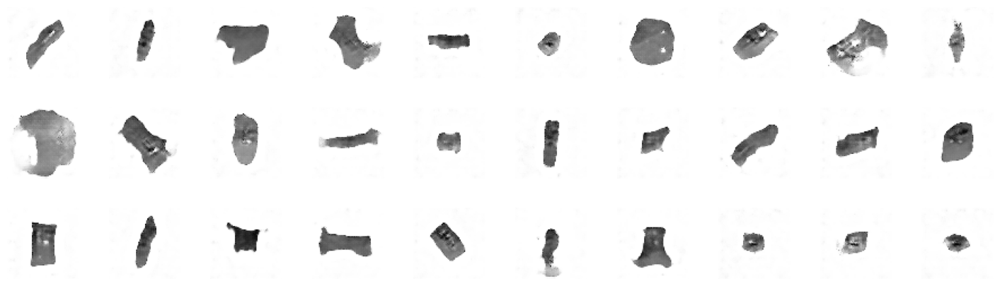

In [40]:
# Draw a plot of decoded images
fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Output the grid of faces
for i in range(grid_width * grid_height):
    ax = fig.add_subplot(grid_height, grid_width, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :], cmap="Greys")

In [41]:
def compare_images(img1, img2):
    return np.mean(np.abs(img1 - img2))

In [42]:
all_data = []
for i in train.as_numpy_iterator():
    all_data.extend(i)
all_data = np.array(all_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


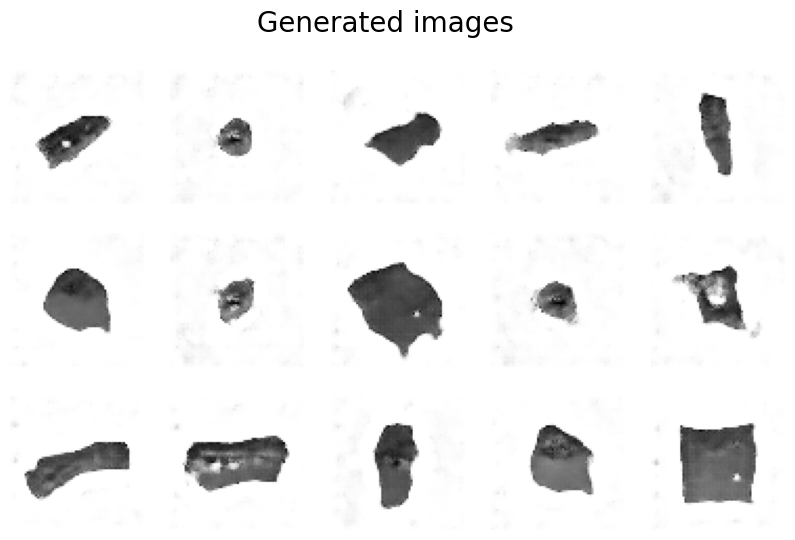

In [43]:
r, c = 3, 5
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Generated images", fontsize=20)

noise = np.random.normal(size=(r * c, Z_DIM))
gen_imgs = generator.predict(noise)

cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt], cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()

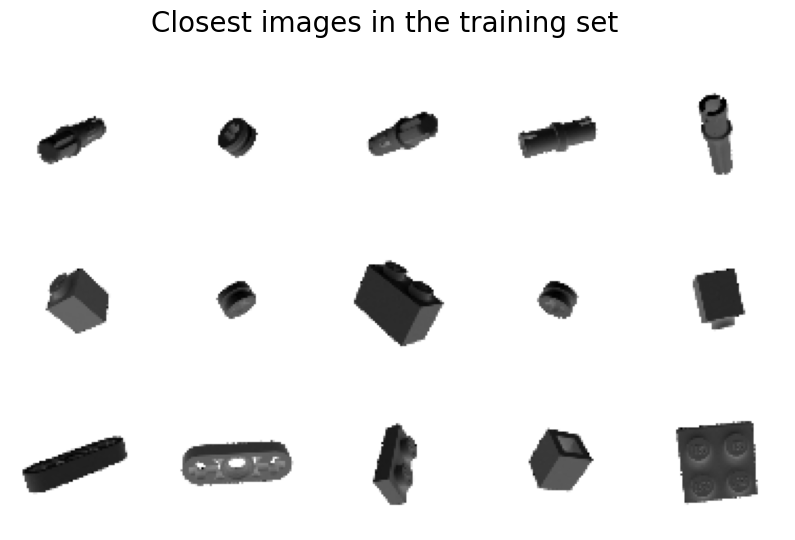

In [44]:
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Closest images in the training set", fontsize=20)

cnt = 0
for i in range(r):
    for j in range(c):
        c_diff = 99999
        c_img = None
        for k_idx, k in enumerate(all_data):
            diff = compare_images(gen_imgs[cnt], k)
            if diff < c_diff:
                c_img = np.copy(k)
                c_diff = diff
        axs[i, j].imshow(c_img, cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()